# Subclustering of mesoderm in Set 2

In [1]:
#loading packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
#loading data
seu_HQC <- readRDS(file = '../../data/seurat_object/Set2/seu_HQC2_Set2.obj')
seu_HQC

An object of class Seurat 
28364 features across 4897 samples within 2 assays 
Active assay: SCT (10860 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


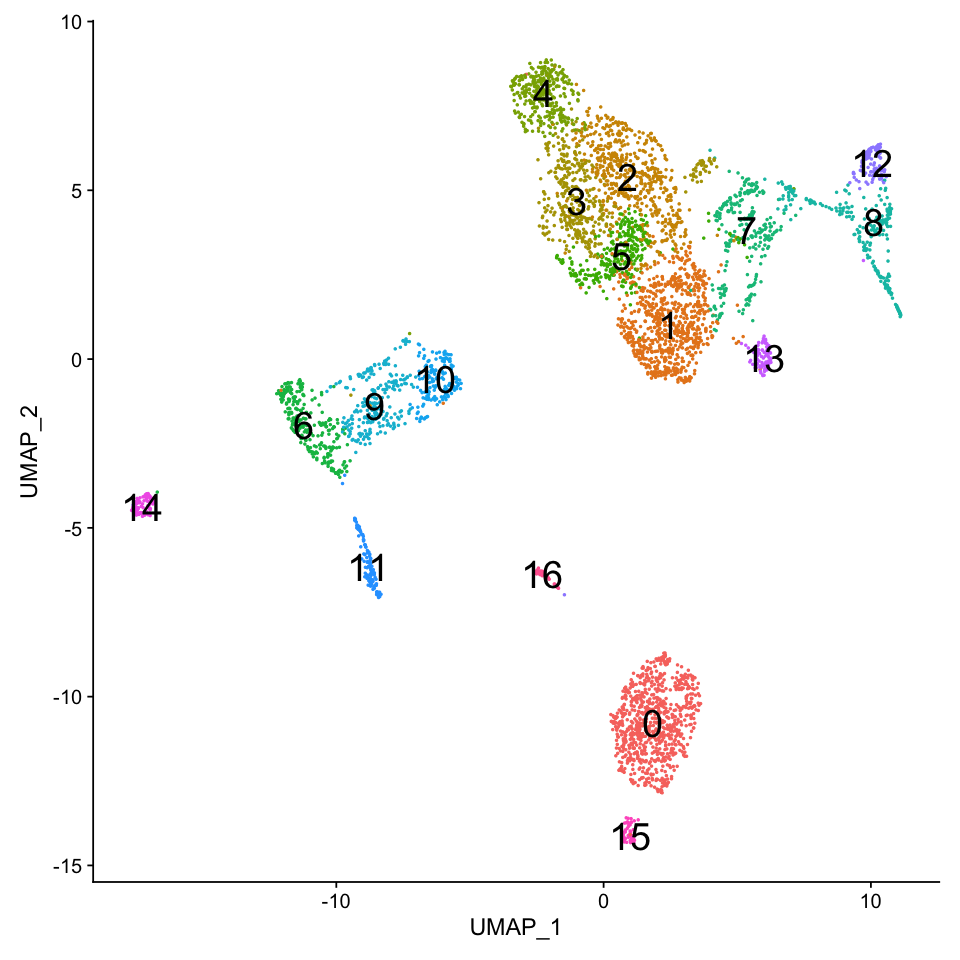

In [3]:
Idents(seu_HQC) <- 'seurat_clusters'
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction = 'umap', label = TRUE, label.size = 8) + NoLegend()

## Trunk Mesoderm
### picking up target clusters

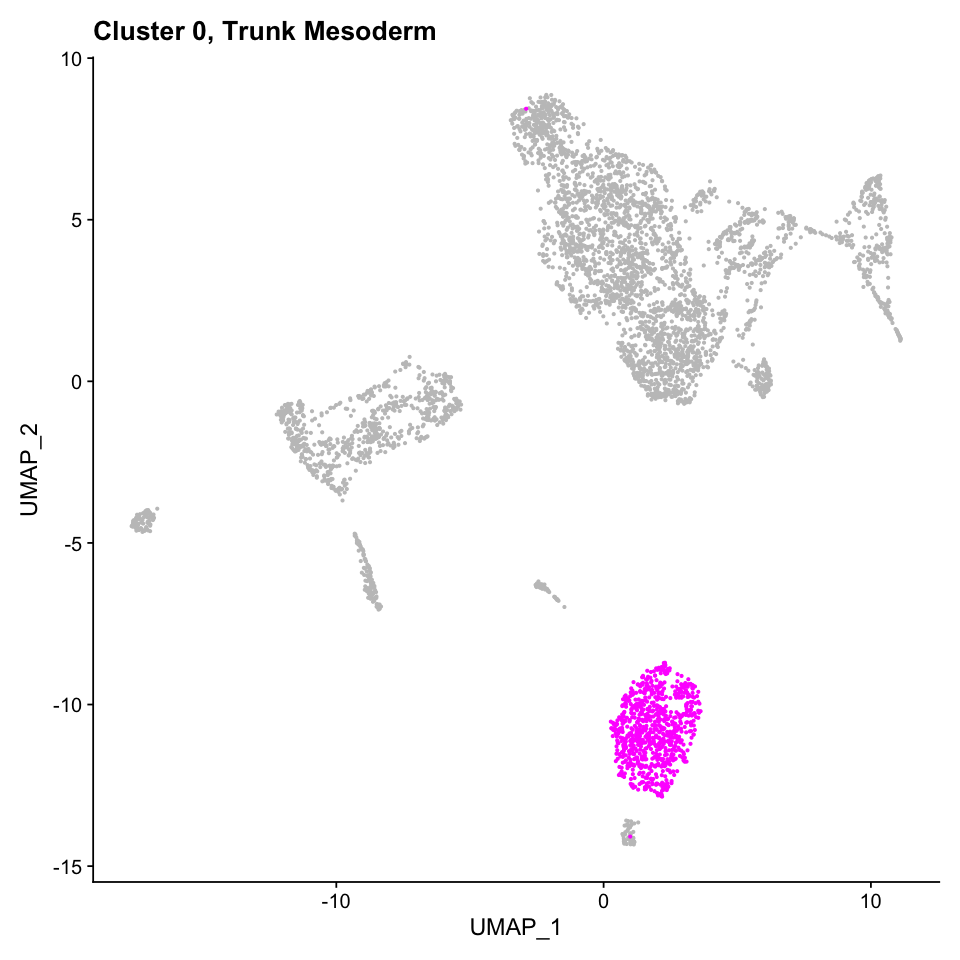

In [4]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(0))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 0, Trunk Mesoderm')

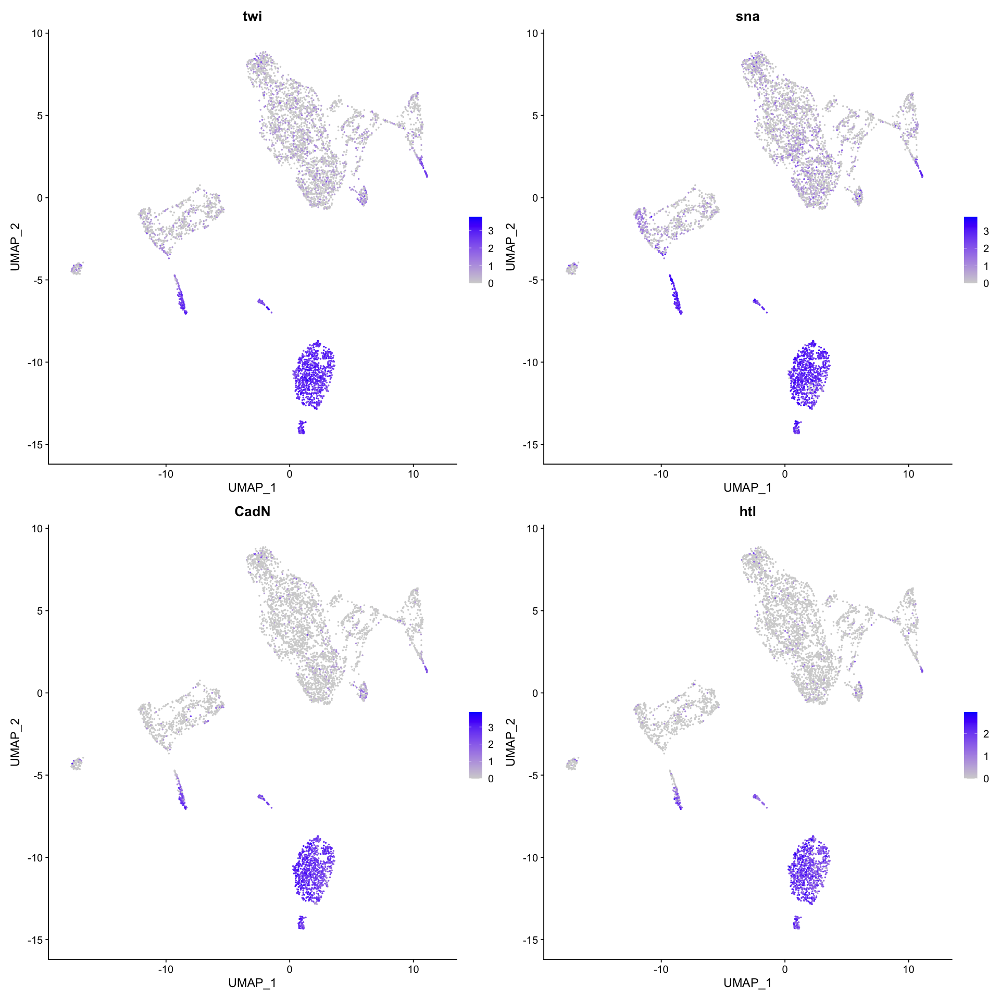

In [5]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('twi','sna','CadN','htl'))

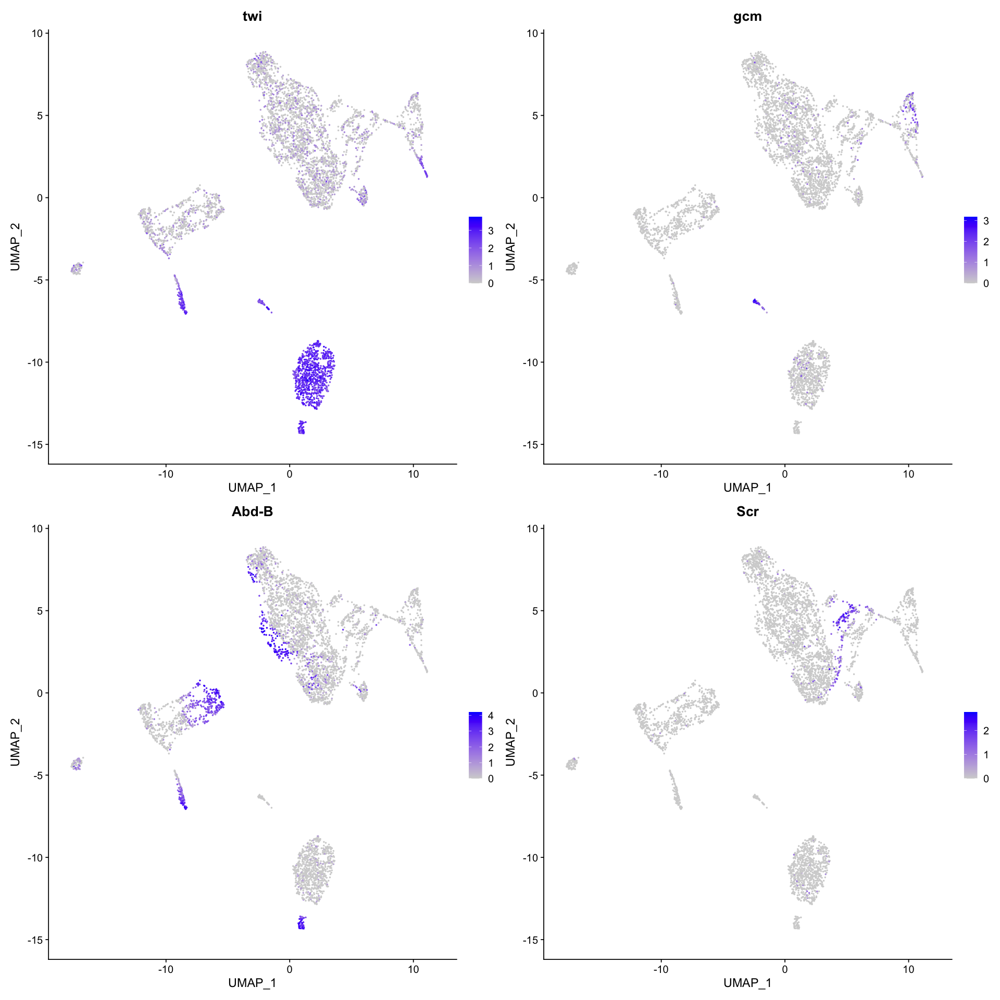

In [6]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('twi','gcm','Abd-B','Scr'))

### Re-normalize and clustering

In [7]:
seu.trunk.meso <- subset(seu_HQC, ident = c(0))
seu.trunk.meso

An object of class Seurat 
28364 features across 812 samples within 2 assays 
Active assay: SCT (10860 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [8]:
DefaultAssay(seu.trunk.meso) <- "RNA"
seu.trunk.meso <- suppressWarnings(SCTransform(seu.trunk.meso, vars.to.regress = c("percent.mt", "percent.rRNA")))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 8804 by 812

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 812 cells



  |======================================================================| 100%


Found 81 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 8804 genes



  |======================================================================| 100%


Computing corrected count matrix for 8804 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 11.09774 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA

Centering data matrix

Set default assay to SCT



PC_ 1 
Positive:  kis, Nrt, scyl, CadN, zld, nej, Dl, Ubx, Myc, CG11873 
	   CG34401, Nup153, spen, Tis11, pigs, CG42232, zfh1, neur, robo2, Traf4 
	   Sin3A, CycE, ptc, wech, NetB, tsh, fs(1)h, shn, ctrip, S 
Negative:  RpL27A, CG2852, eEF1alpha1, Fer2LCH, RpS4, RpS15, RpS11, alphaTub84B, RpS18, RpL7 
	   Fer1HCH, RpS2, kra, betaTub56D, RpL19, RpLP1, sta, RpS23, RpL10Ab, RpLP2 
	   SelT, RpL37a, RpL23, RpL14, RpS20, tsr, Sod3, Idgf6, mt:CoIII, Nplp2 
PC_ 2 
Positive:  RpL41, RpLP1, RpLP2, RpS16, RpS15, RpL27A, RpL37a, RpS26, RpL32, RpL19 
	   RpL14, RpL28, RpS29, RpS11, RpL36A, RpL18A, RpL10Ab, RpS23, RpL36, RpS20 
	   RpL17, RpS18, RpL13A, RpS4, Antp, RpL23, RpS19a, RpS2, RpS25, sta 
Negative:  wntD, E(spl)m8-HLH, CG10035, E(spl)m7-HLH, Brd, betaTub56D, Ama, E(spl)malpha-BFM, Fer2LCH, stg 
	   Fer1HCH, E(spl)m5-HLH, Rtnl1, link, trn, Tom, BobA, Hel25E, Sod3, Act87E 
	   Fkbp39, alphaTub84B, CG43355-sala, CG2852, SelT, CG4440, scyl, CG16758, Ubx, Idgf6 
PC_ 3 
Positive:  Antp, trn, Im

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 812
Number of edges: 29706

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5712
Number of communities: 8
Elapsed time: 0 seconds


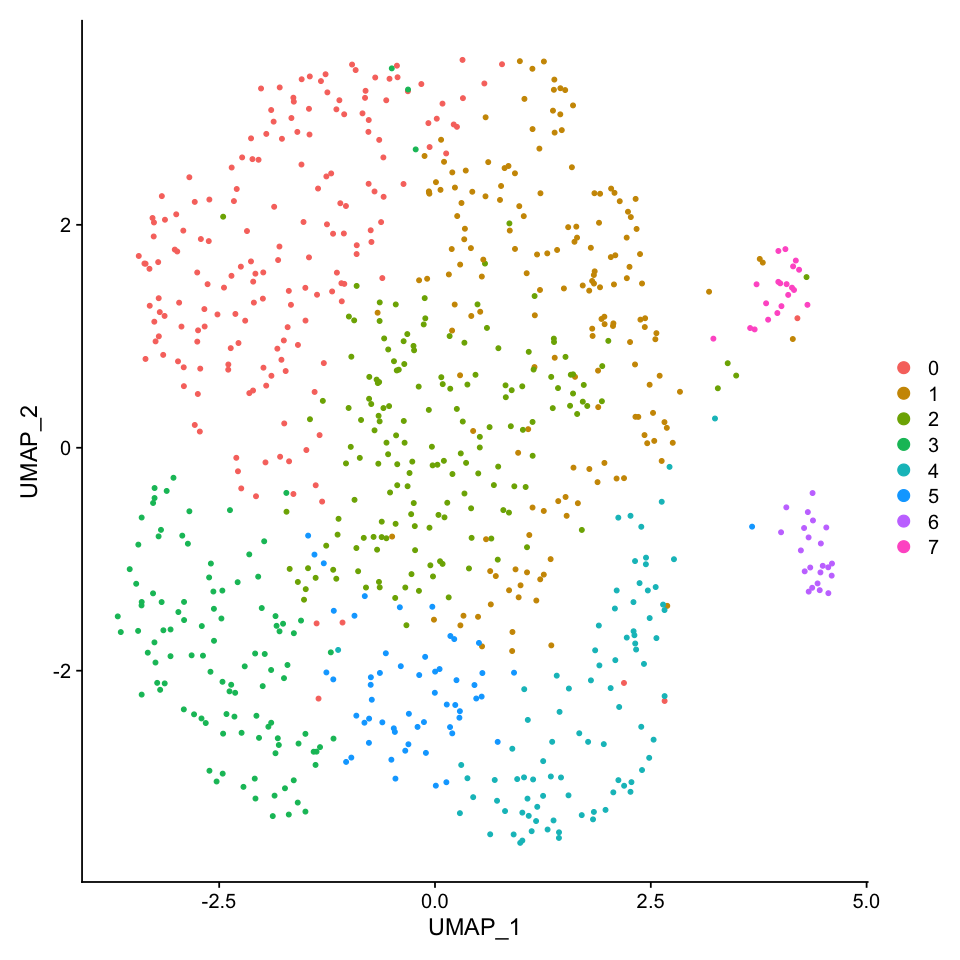

In [9]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunPCA(seu.trunk.meso)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindNeighbors(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindClusters(seu.trunk.meso)
DimPlot(seu.trunk.meso, reduction = 'umap')

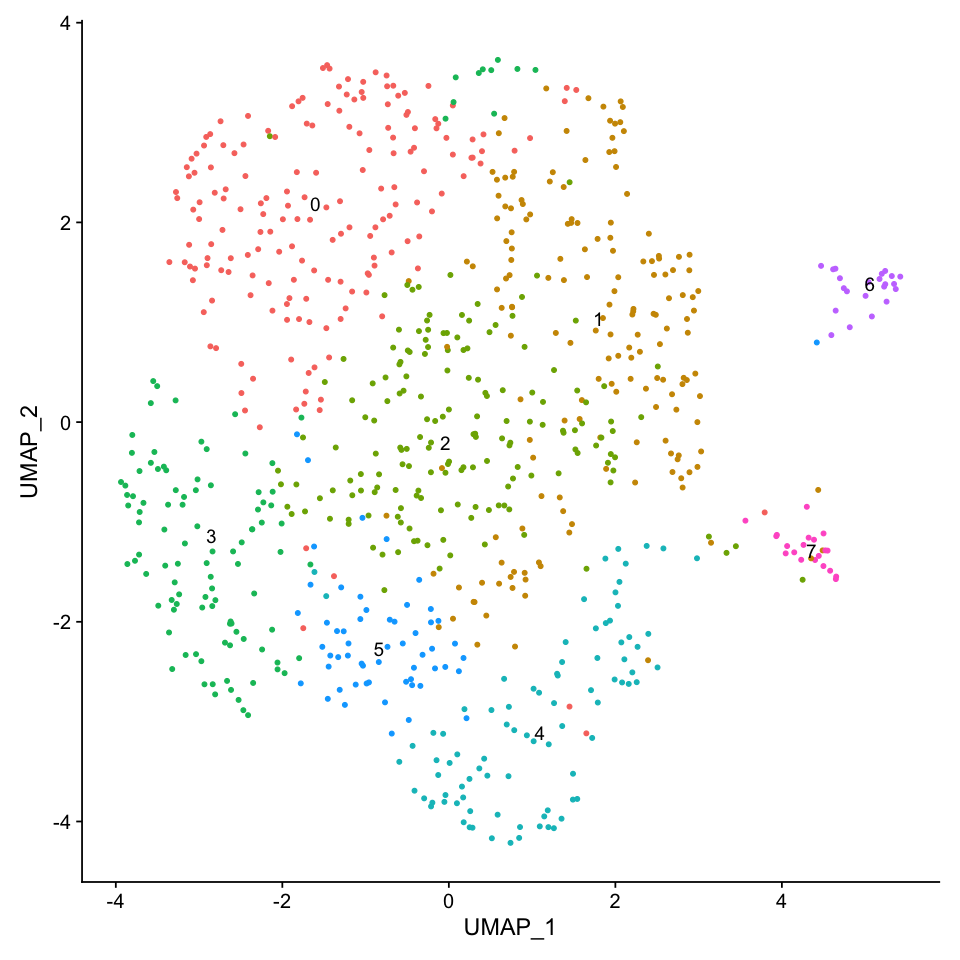

In [10]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
DimPlot(seu.trunk.meso, reduction =  "umap", label = TRUE) + NoLegend()

In [11]:
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7



[1] 677

[1] 73

Warning message in DoHeatmap(seu.trunk.meso, features = c(all.markers.meso.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: RpL39, RpS21”


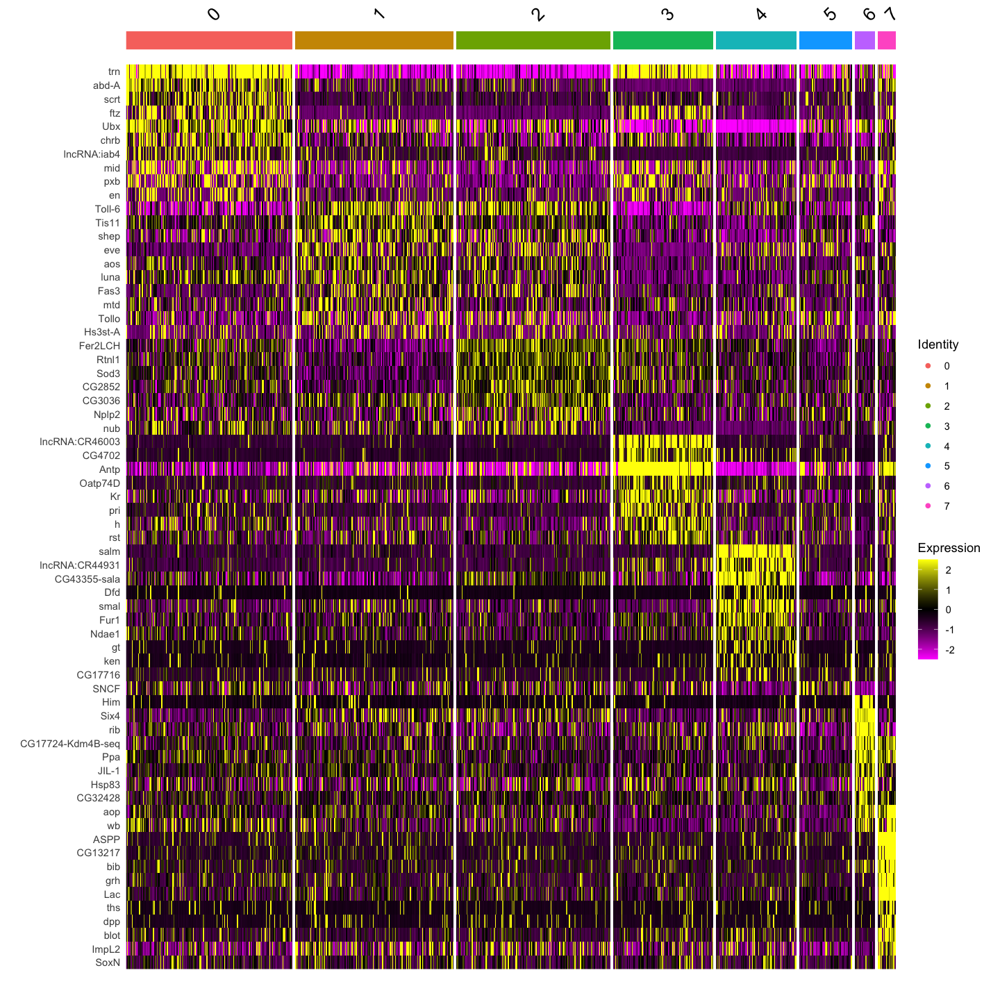

In [12]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c(all.markers.meso.top10$gene))

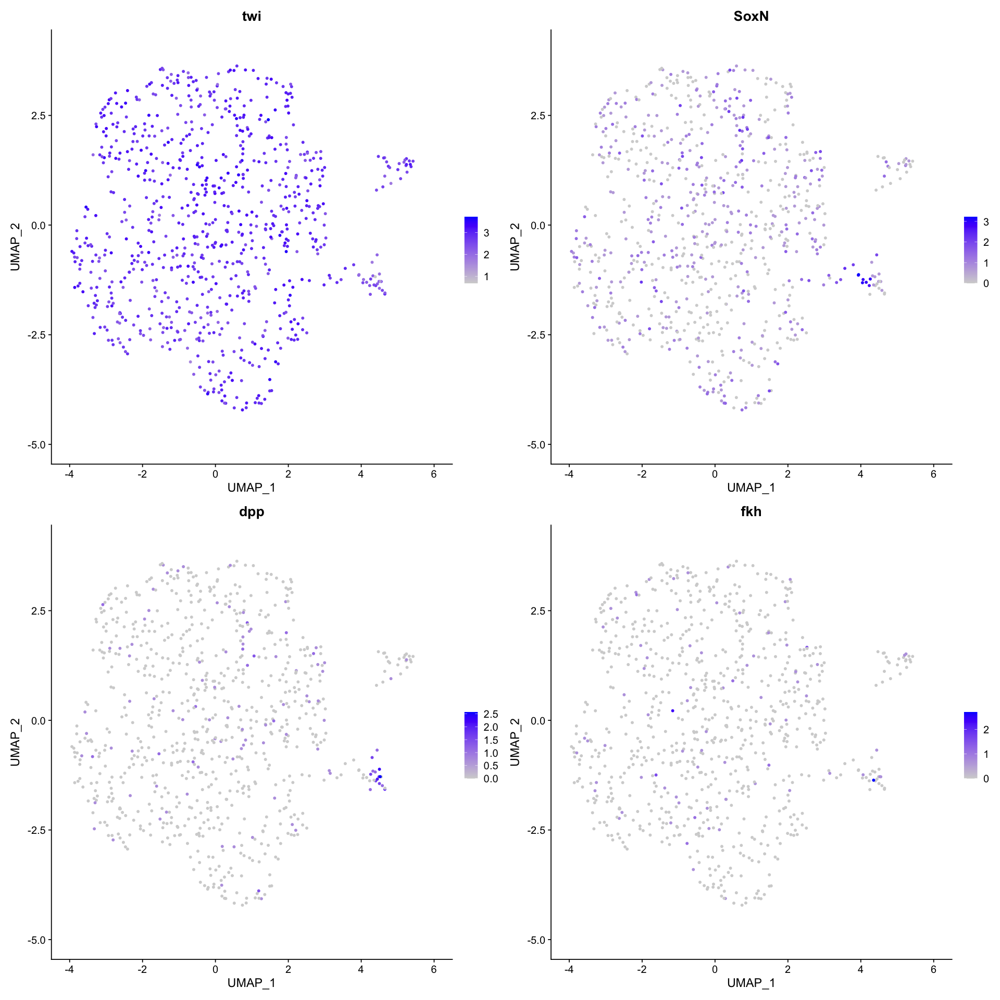

In [13]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.trunk.meso, features = c('twi','SoxN','dpp','fkh'))

cluster 7 : doublet, expressing ectoderm markers

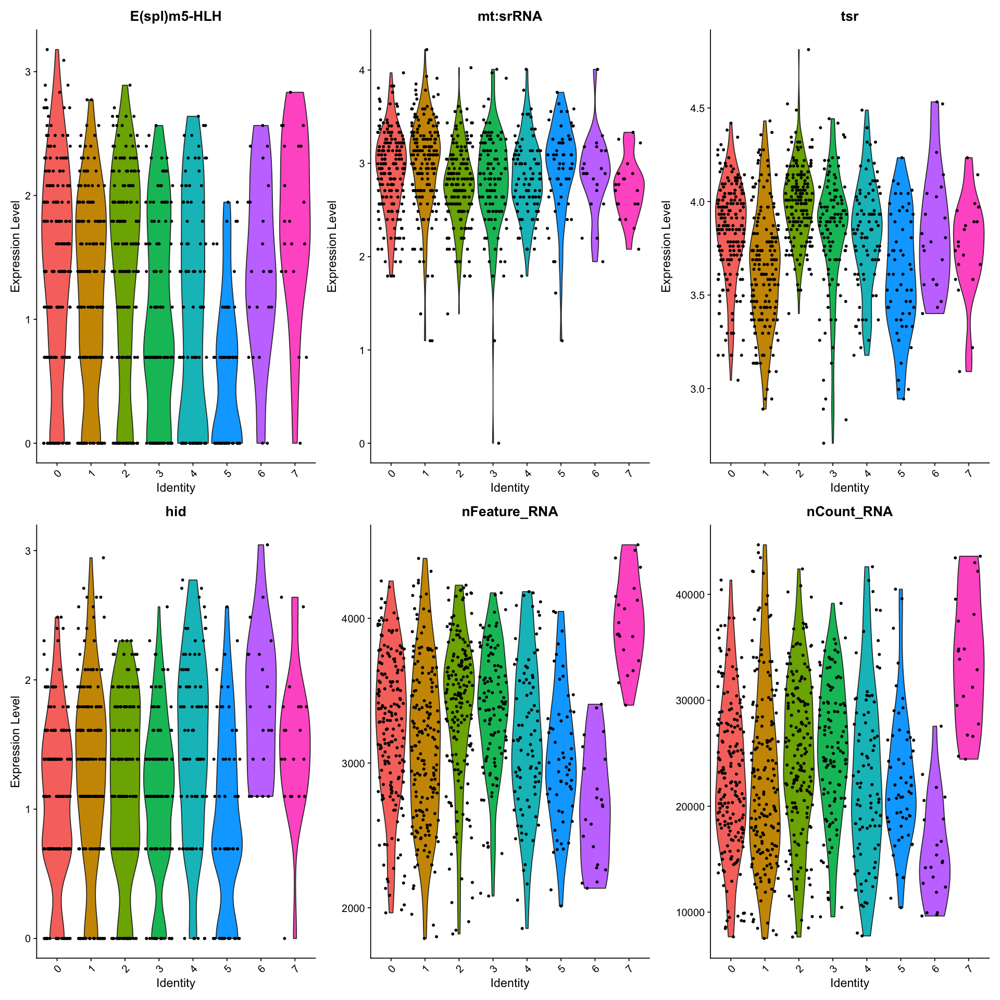

In [14]:
options(repr.plot.width=16, repr.plot.height=16)
VlnPlot(seu.trunk.meso, features = c('E(spl)m5-HLH','mt:srRNA','tsr','hid', 'nFeature_RNA','nCount_RNA'))

Cluster 6 shows smaller total count and number of detected genes.   
Cluster 7 shows larger total count and number of detected genes.

In [15]:
seu.lowquality <- subset(seu.trunk.meso, ident=c(6))
seu.lowquality

An object of class Seurat 
26308 features across 22 samples within 2 assays 
Active assay: SCT (8804 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [16]:
seu.lowquality$manual_ID <- 'low_quality_cells'

In [17]:
write(colnames(seu.lowquality), file='./low_quality_cell_trunk_meso.txt')

### Removing doublet and low-quality cells and clutering again

In [18]:
seu.trunk.meso <- subset(seu.trunk.meso, ident=c(6, 7), invert = TRUE) 
seu.trunk.meso

An object of class Seurat 
26308 features across 770 samples within 2 assays 
Active assay: SCT (8804 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

PC_ 1 
Positive:  kis, Nrt, scyl, CadN, zld, nej, Ubx, Tis11, Myc, pigs 
	   Nup153, CG11873, CG42232, zfh1, CG34401, spen, Dl, neur, CycE, Traf4 
	   NetB, Sin3A, CG46385, shn, ptc, tsh, cnn, ctrip, Mef2, fs(1)h 
Negative:  RpL27A, eEF1alpha1, CG2852, Fer2LCH, RpS15, RpS11, RpS4, RpL7, RpS18, alphaTub84B 
	   Fer1HCH, RpS2, RpLP1, kra, RpL19, RpS23, sta, RpL10Ab, betaTub56D, RpLP2 
	   RpL37a, SelT, RpL23, RpL14, RpS20, Sod3, mt:CoIII, Idgf6, tsr, RpL13A 
PC_ 2 
Positive:  RpL41, RpLP1, RpLP2, RpS16, RpS15, RpL27A, RpL37a, RpS26, RpL32, RpL19 
	   RpS29, RpL28, RpL14, RpS11, RpL36A, RpL10Ab, RpL18A, RpS23, RpL36, RpS20 
	   Antp, RpS4, RpL17, RpS18, RpL13A, RpL23, RpS19a, RpS2, RpS25, sta 
Negative:  wntD, E(spl)m8-HLH, E(spl)m7-HLH, CG10035, Brd, betaTub56D, Ama, E(spl)malpha-BFM, stg, Fer2LCH 
	   Fer1HCH, E(spl)m5-HLH, Rtnl1, Tom, link, trn, BobA, Act87E, Hel25E, Sod3 
	   alphaTub84B, Fkbp39, Ubx, SelT, CG2852, CG43355-sala, CG4440, Idgf6, CG16758, E(spl)mbeta-HLH 
PC_ 3 
Positive

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 770
Number of edges: 29315

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5442
Number of communities: 6
Elapsed time: 0 seconds


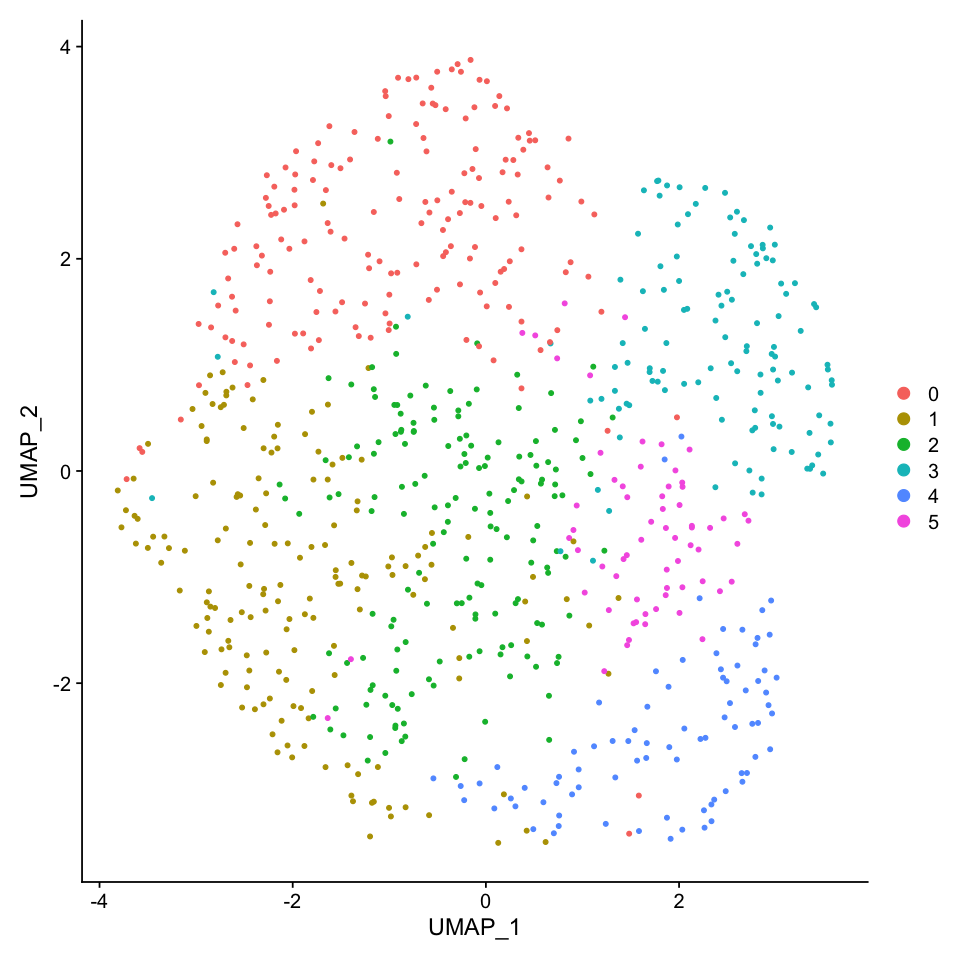

In [19]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunPCA(seu.trunk.meso)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindNeighbors(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindClusters(seu.trunk.meso)
DimPlot(seu.trunk.meso, reduction = 'umap')

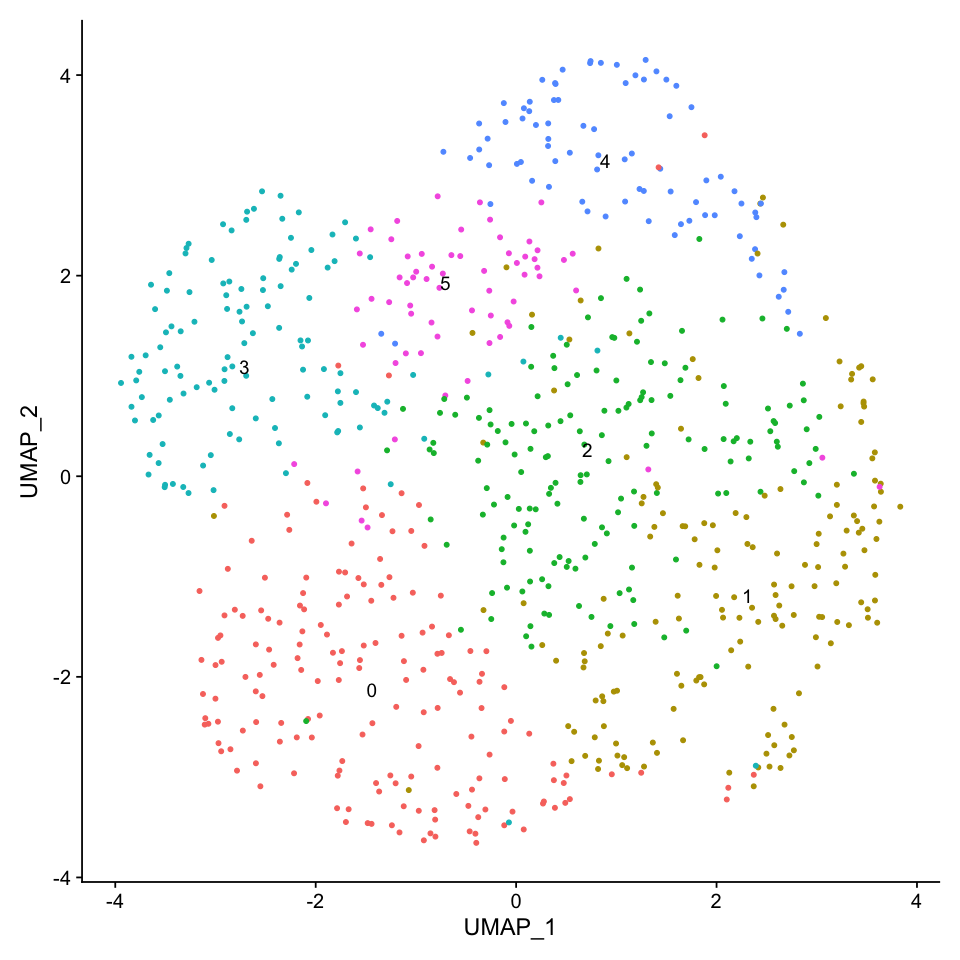

In [20]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
DimPlot(seu.trunk.meso, reduction =  "umap", label = TRUE) + NoLegend()

In [21]:
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



[1] 203

[1] 52

Warning message in DoHeatmap(seu.trunk.meso, features = c("sna", "twi", "Act87E", :
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: RpL39”


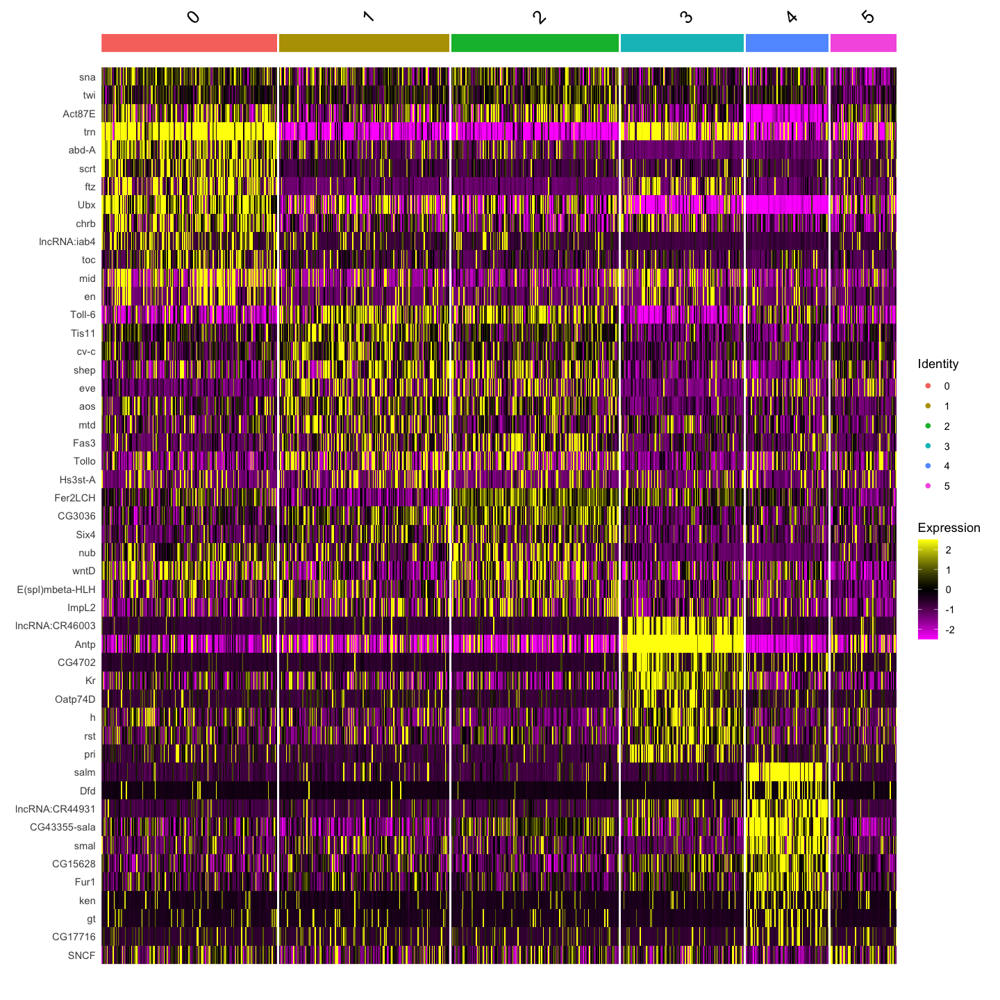

In [22]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c("sna", "twi", 'Act87E', all.markers.meso.top10$gene))

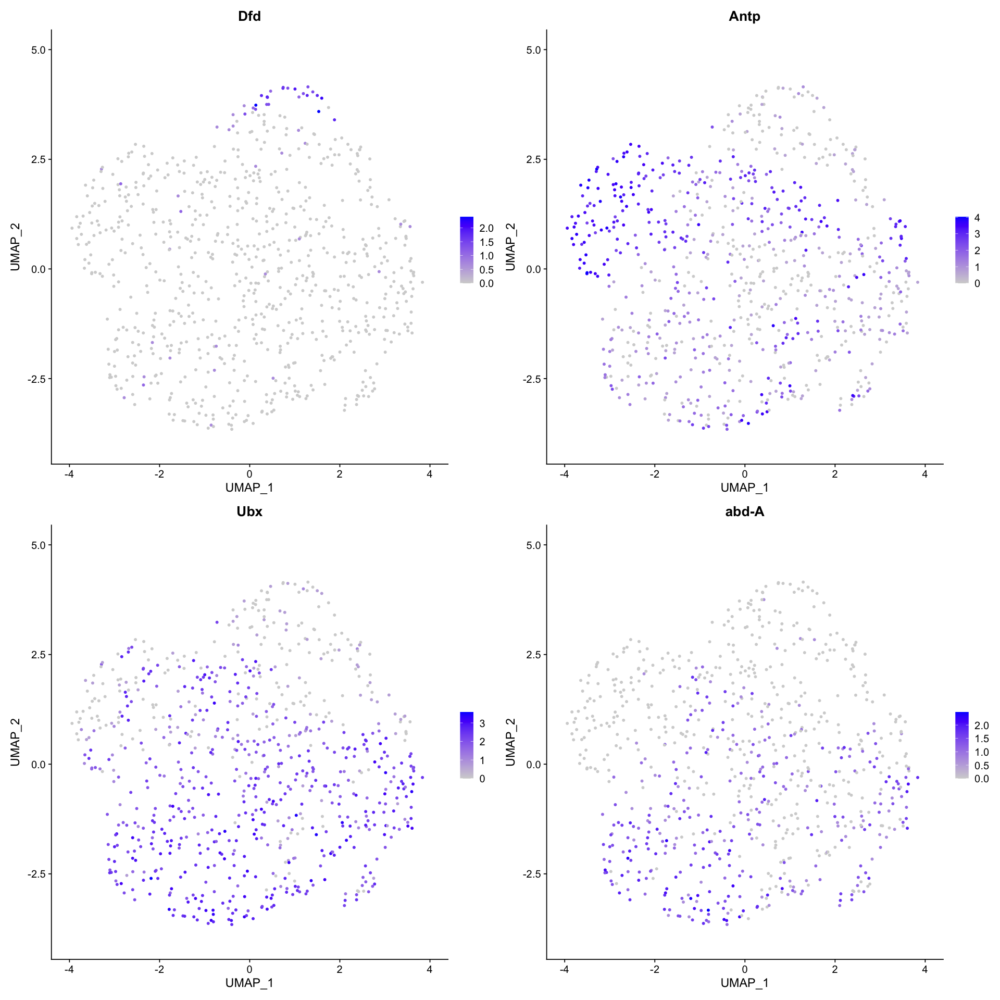

In [23]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.trunk.meso, features = c('Dfd','Antp','Ubx','abd-A'))

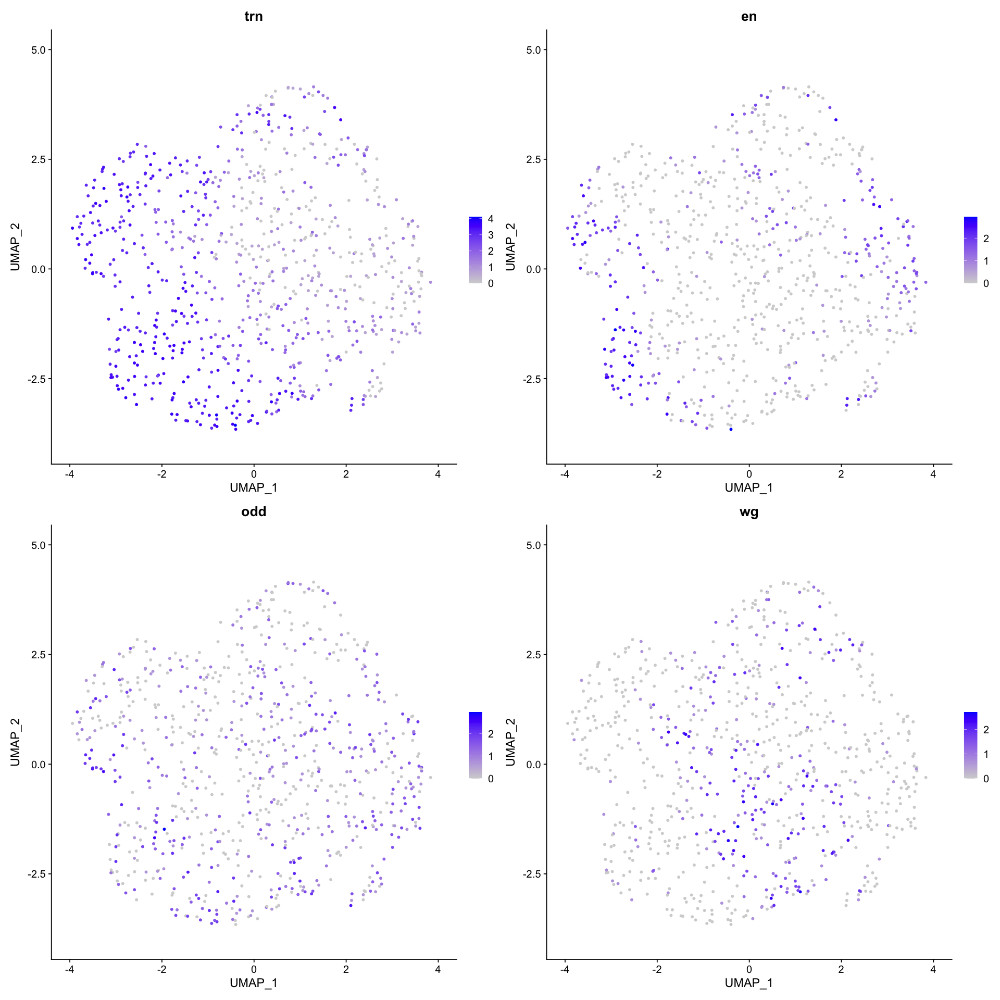

In [24]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.trunk.meso, features = c('trn','en','odd','wg'))

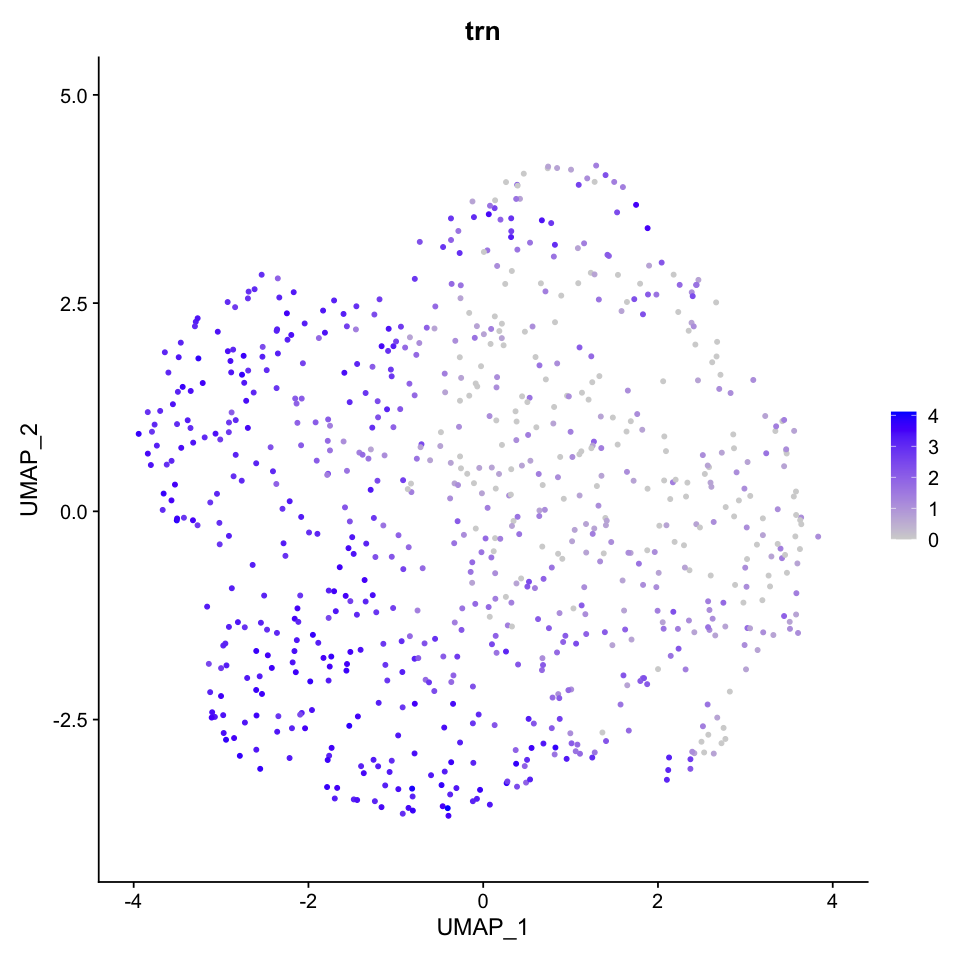

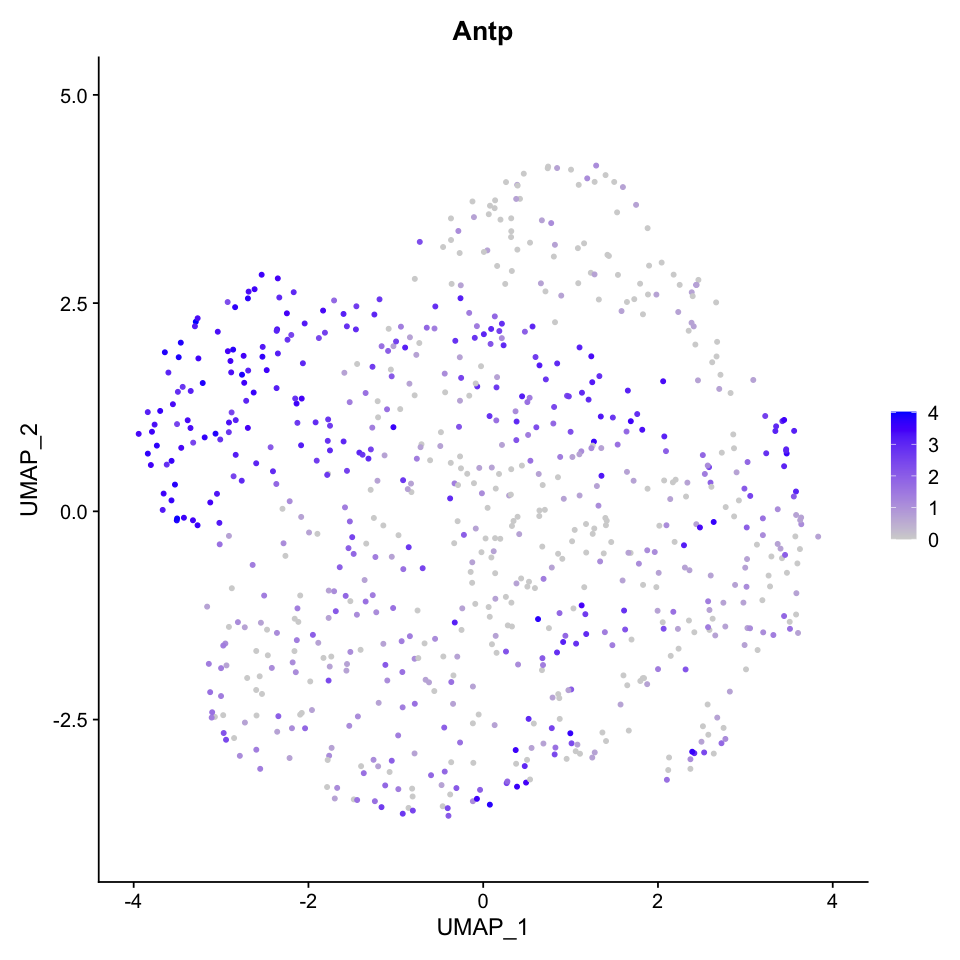

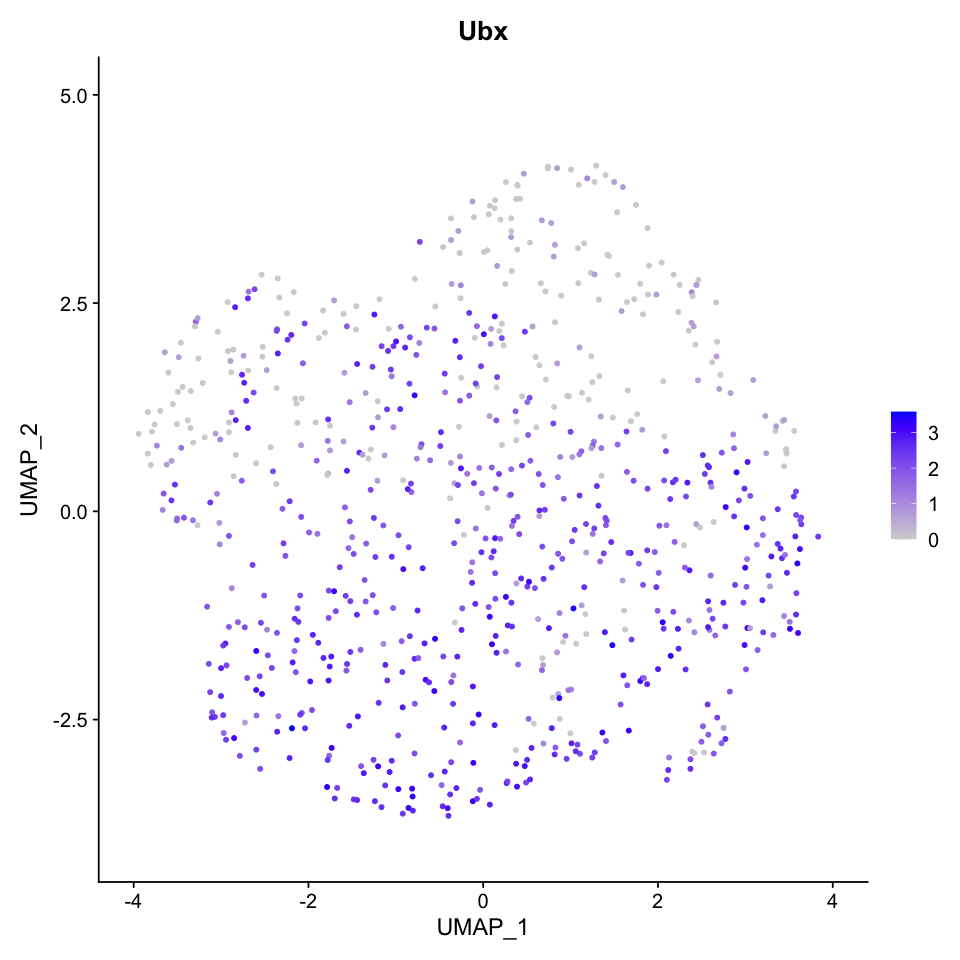

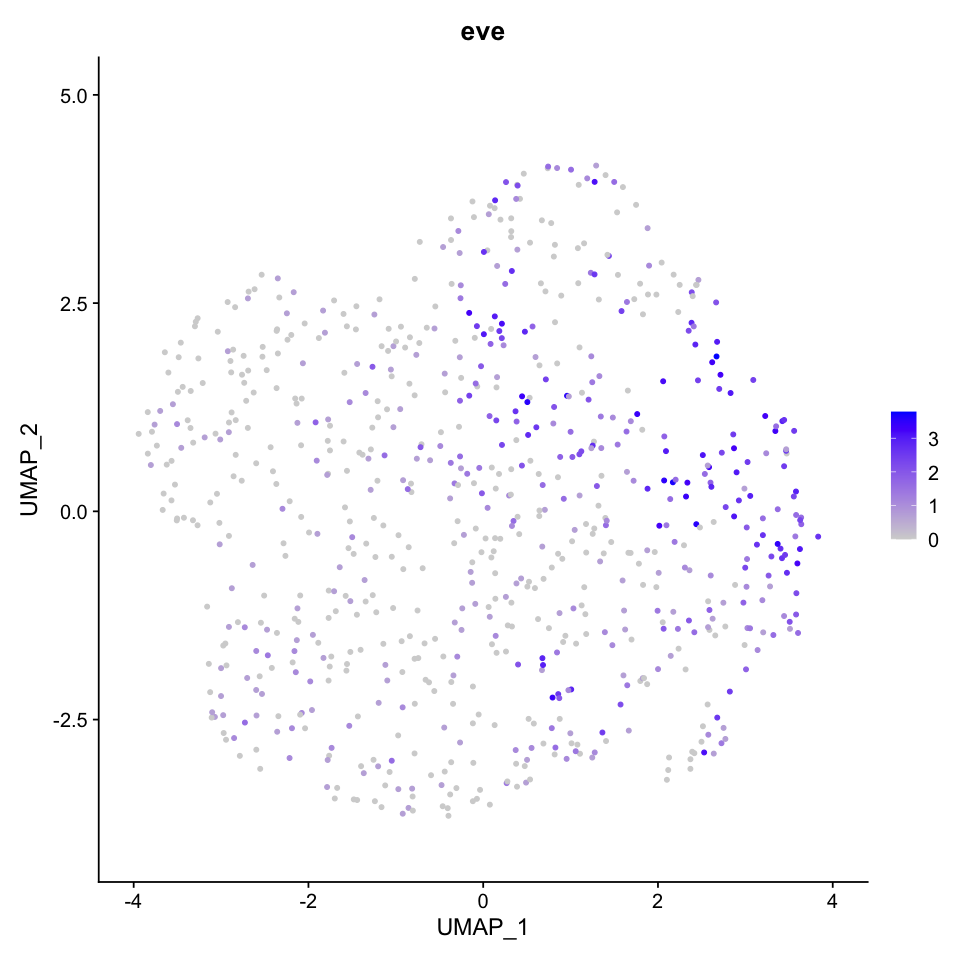

In [25]:
path = './figures/07_mesoderm_subclutering_Set2'
for (name in c('trn','Antp','Ubx','eve')){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu.trunk.meso, features = name)
    plot(p)
    basename = paste(name, '_Set2_trunk_meso.eps', sep = '')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

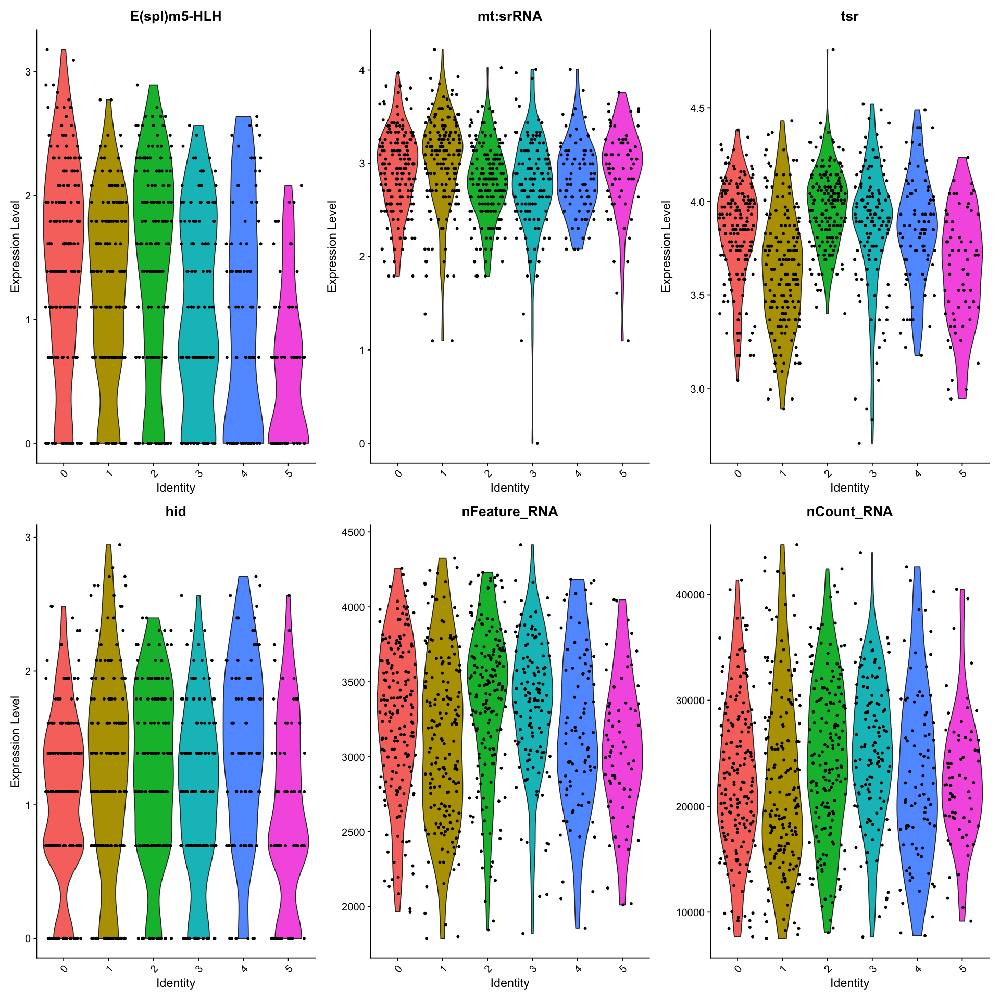

In [26]:
options(repr.plot.width=16, repr.plot.height=16)
VlnPlot(seu.trunk.meso, features = c('E(spl)m5-HLH','mt:srRNA','tsr','hid', 'nFeature_RNA','nCount_RNA'))

cluster 4: salm+ --> PS1, PS2, PS3  
cluster 3: Antp+, trn+ --> PS4  
cluster 0: trn+ --> abdominal even  
others: abodminal odd  

### Annotation PS1-3
cluster 4 expressed salm (marker of PS1-3)

In [27]:
seu.trunk.meso.c4 <- subset(seu.trunk.meso, ident = c(4))
seu.trunk.meso.c4

An object of class Seurat 
26308 features across 81 samples within 2 assays 
Active assay: SCT (8804 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  Act87E, Ubx, Antp, CG1673, tsh, lncRNA:bxd, shep, trn, Glut4EF, abd-A 
	   nub, E(spl)m7-HLH, Egfr, BobA, luna, phu, stg, Tis11, E(spl)m8-HLH, chrb 
	   Tom, HmgZ, SNCF, E(spl)m4-BFM, lncRNA:CR43432, HmgD, lncRNA:iab4, Nrt, E2f1, ftz 
Negative:  salm, CG43355-sala, smal, lncRNA:CR44931, Dfd, gt, Fur1, CG15628, Ndae1, CG17716 
	   tmod, ken, CG33099, CG13427, CG3502, path, lama, CG12420, NetB, cher 
	   rdx, lncRNA:Hsromega, px, Gbs-70E, rpr, sick, bnl, CG14688, CG43658, Uhg2 
PC_ 2 
Positive:  RpLP1, RpLP2, RpL27A, RpL14, RpL19, RpS15, RpL23, RpS16, RpL7, 28SrRNA-Psi:CR45860 
	   RpS23, RpL37a, trn, RpS4, RpS11, RpL10Ab, Antp, CG13427, RpL41, eEF1alpha1 
	   CG4702, Ubx, sta, RpS18, RpLP0, RpL36A, ftz, RpL32, RpS2, RpL13A 
Negative:  ich, E(spl)m8-HLH, zfh1, hth, smal, rib, lncRNA:CR44931, Nrt, E(spl)malpha-BFM, k

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 81
Number of edges: 3238

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2000
Number of communities: 1
Elapsed time: 0 seconds


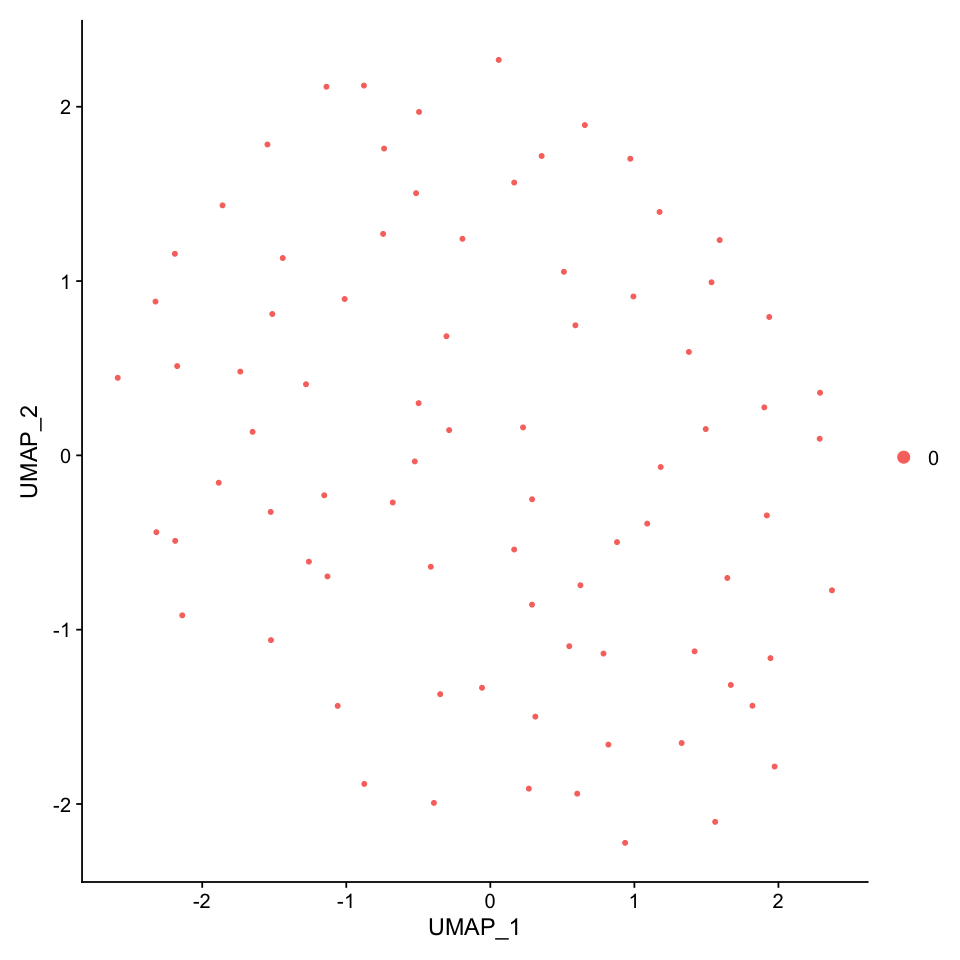

In [28]:
seu.trunk.meso.c4 <- RunPCA(seu.trunk.meso.c4)
seu.trunk.meso.c4 <- RunUMAP(seu.trunk.meso.c4, dims = 1:30)
seu.trunk.meso.c4 <- FindNeighbors(seu.trunk.meso.c4, dims = 1:30)
seu.trunk.meso.c4 <- FindClusters(seu.trunk.meso.c4)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso.c4, reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 81
Number of edges: 3238

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.0683
Number of communities: 3
Elapsed time: 0 seconds


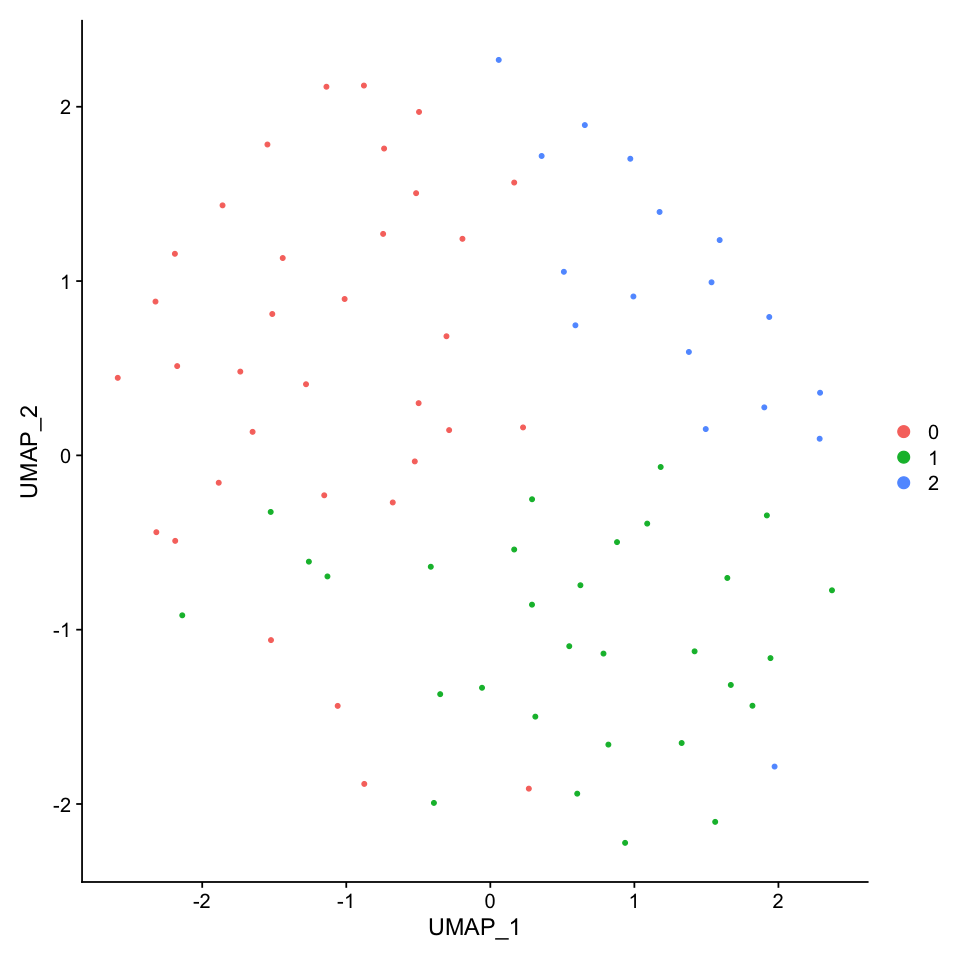

In [29]:
seu.trunk.meso.c4 <- FindClusters(seu.trunk.meso.c4, resolution = 1.0)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso.c4, reduction = 'umap')

In [30]:
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso.c4, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2



[1] 267

[1] 30

Warning message in DoHeatmap(seu.trunk.meso.c4, features = c(all.markers.meso.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: mRpL49, Fnta, Mgstl”


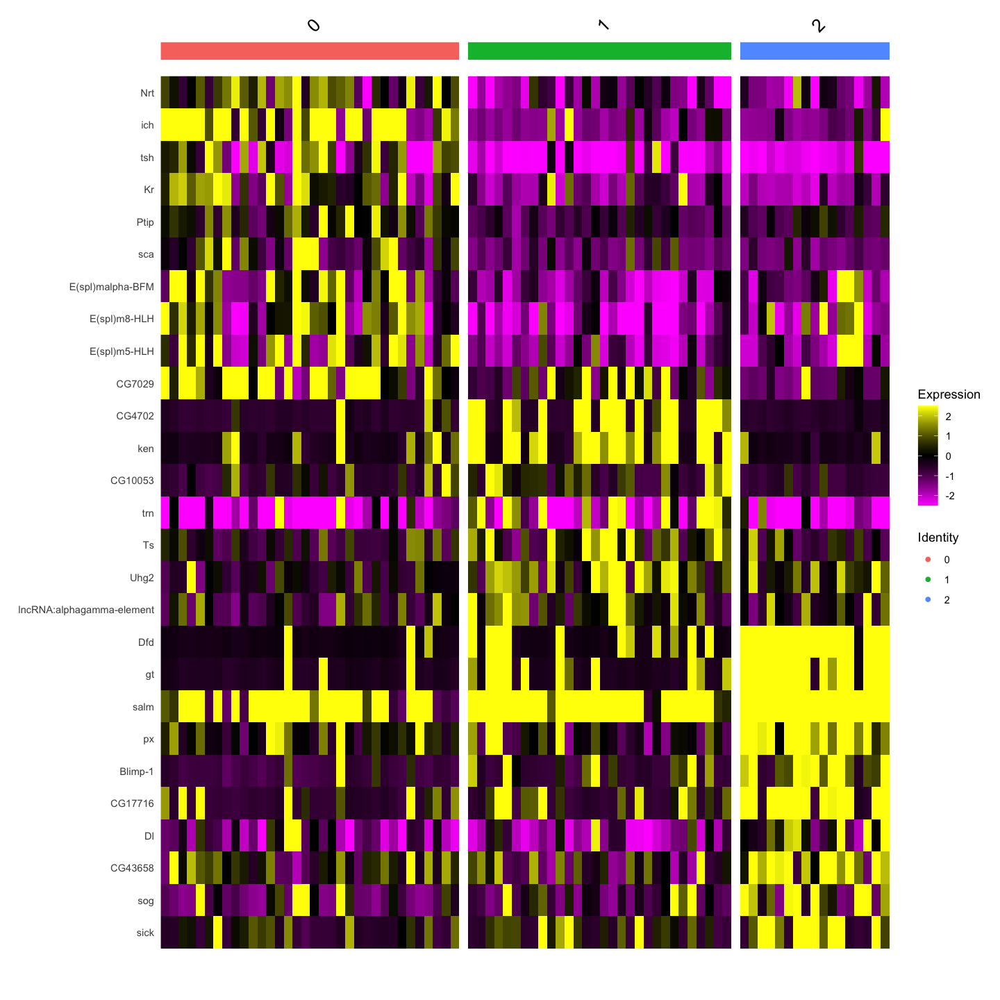

In [31]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso.c4, features = c(all.markers.meso.top10$gene))

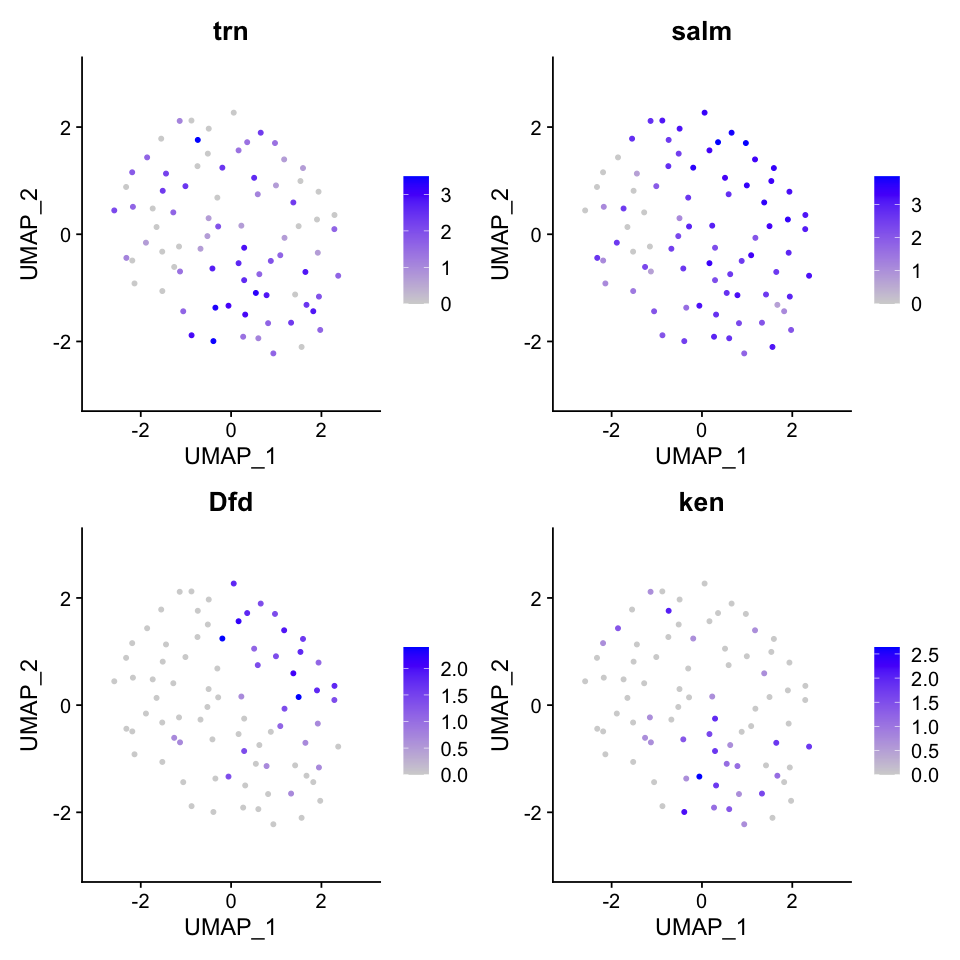

In [32]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso.c4, features = c('trn','salm','Dfd','ken'))

,manual_ID
,<fct>
AAGGTAAAGCAAACAT,0
AAGTACCCAAATGCGG,1
ACACCAAGTATGTCCA,0
ACACTGAGTAGTGATA,1
ACCCAAAGTTCGCGTG,1
ACGTAGTTCCCAGTGG,1


,manual_ID
,<chr>
AAGGTAAAGCAAACAT,mesoderm_PS3
AAGTACCCAAATGCGG,mesoderm_PS2_ken
ACACCAAGTATGTCCA,mesoderm_PS3
ACACTGAGTAGTGATA,mesoderm_PS2_ken
ACCCAAAGTTCGCGTG,mesoderm_PS2_ken
ACGTAGTTCCCAGTGG,mesoderm_PS2_ken


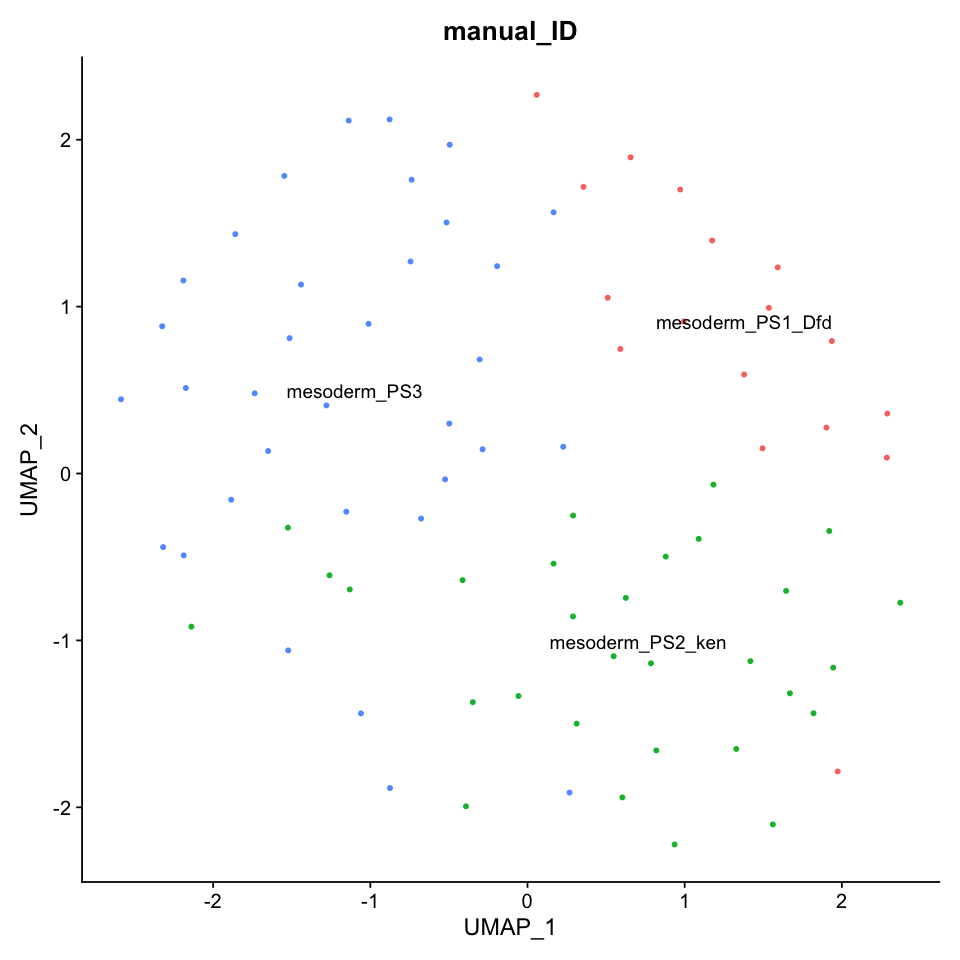

In [33]:
manual_id <- as.data.frame(seu.trunk.meso.c4$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)

manual_id$manual_ID <- gsub("0", "mesoderm_PS3", manual_id$manual_ID) #Dfd-, ken-, Antp-, Kr+
manual_id$manual_ID <- gsub("1", "aaa", manual_id$manual_ID) #Dfd+ #mesoderm_PS2_Dfd
manual_id$manual_ID <- gsub("2", "mesoderm_PS1_Dfd", manual_id$manual_ID) #Dfd+
manual_id$manual_ID <- gsub("aaa","mesoderm_PS2_ken", manual_id$manual_ID) #ken+

head(manual_id)

seu.trunk.meso.c4$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso.c4, reduction = 'umap', label = TRUE, group.by = 'manual_ID') + NoLegend()

### Trying to separate PS4 and PS6
cluster 3 expressing trn and Antp  

In [34]:
seu.trunk.meso.c3 <- subset(seu.trunk.meso, ident = c(3))
seu.trunk.meso.c3

An object of class Seurat 
26308 features across 121 samples within 2 assays 
Active assay: SCT (8804 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

PC_ 1 
Positive:  Ubx, Dl, Toll-6, lncRNA:bxd, abd-A, luna, Tollo, eve, nub, wb 
	   Tis11, Glut4EF, aos, CG43658, Myc, px, zfh1, CG1673, CG9328, fz 
	   GEFmeso, knrl, E(spl)mbeta-HLH, smal, Mef2, CG34401, RapGAP1, RhoGAP71E, mthl1, CG13784 
Negative:  Antp, lncRNA:CR46003, trn, CG4702, pri, Kr, ftz, Oatp74D, CG6398, h 
	   rgr, bnb, lncRNA:CR44931, Fer2LCH, eEF1alpha1, rst, CG2852, Fer1HCH, alphaTub84B, Idgf6 
	   rpr, Idgf4, betaTub56D, CG17265, egr, Ama, Cys, Sod3, svp, SelT 
PC_ 2 
Positive:  Toll-6, slp1, wg, CG2852, eve, Nplp2, lncRNA:bxd, luna, CG43355-sala, RpLP1 
	   abd-A, RpL7, shep, ich, RpS20, Six4, Tollo, alphaTub84B, tsr, Ubx 
	   RpS11, RpS2, RpL27A, RpS15, RpL37a, RpL14, scu, RpLP2, CG4440, cathD 
Negative:  lncRNA:CR46003, trn, Antp, Oatp74D, Kr, rst, chrb, ftz, h, mid 
	   rpr, Shroom, CG4702, tsh, ptc, CG17265, odd, robo2, scyl, lncRNA:Hsromega 
	   kis, jigr1, hth, lncRNA:CR43887, Nrt, rib, Toll-7, nej, CG8677, CG11873 
PC_ 3 
Positive:  ftz, mid, en, E(spl)m8-HLH

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 121
Number of edges: 6382

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2231
Number of communities: 2
Elapsed time: 0 seconds


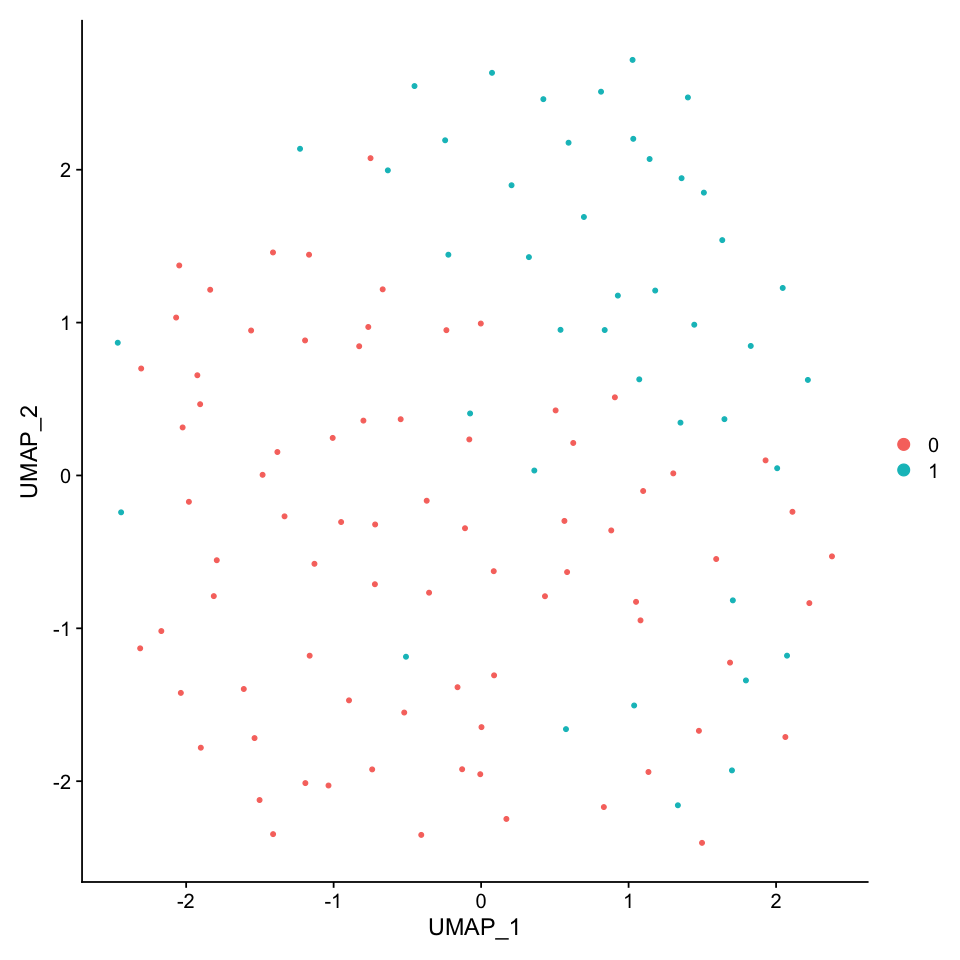

In [35]:
seu.trunk.meso.c3 <- RunPCA(seu.trunk.meso.c3)
seu.trunk.meso.c3 <- RunUMAP(seu.trunk.meso.c3, dims = 1:30)
seu.trunk.meso.c3 <- FindNeighbors(seu.trunk.meso.c3, dims = 1:30)
seu.trunk.meso.c3 <- FindClusters(seu.trunk.meso.c3)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso.c3, reduction = 'umap')

In [36]:
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso.c3, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1



[1] 211

[1] 20

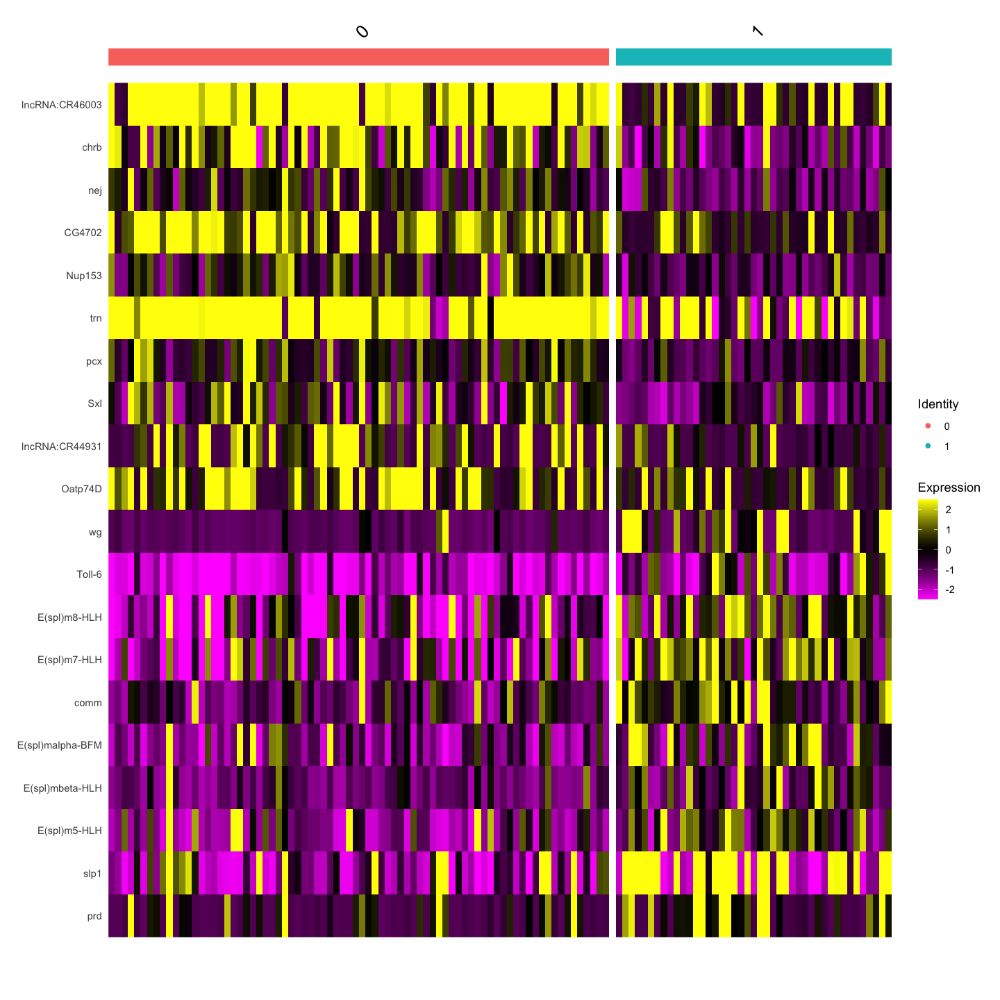

In [37]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso.c3, features = c(all.markers.meso.top10$gene))

PS4(Ubx-) and PS6(Ubx+) can not be separated

### Annotate others

In [38]:
seu.trunk.meso.wo.c4 <- subset(seu.trunk.meso, ident = 4, invert = TRUE)
seu.trunk.meso.wo.c4

An object of class Seurat 
26308 features across 689 samples within 2 assays 
Active assay: SCT (8804 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [39]:
manual_id <- as.data.frame(seu.trunk.meso.wo.c4$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)

manual_id$manual_ID <- gsub("5", "mesoderm_PS5_and_abdominal_odd", manual_id$manual_ID) #trn-
manual_id$manual_ID <- gsub("1", "mesoderm_PS5_and_abdominal_odd", manual_id$manual_ID) 
manual_id$manual_ID <- gsub("0", "mesoderm_abdominal_even", manual_id$manual_ID) 
manual_id$manual_ID <- gsub("2", "mesoderm_PS5_and_abdominal_odd", manual_id$manual_ID) 
manual_id$manual_ID <- gsub("3", "mesoderm_PS4_and_PS6", manual_id$manual_ID) #Antp+, trn+
head(manual_id)
#trn- cells included Antp+ cells (PS5)

,manual_ID
,<fct>
AAAGGTAAGACATACA,2
AAAGGTATCCATGATG,3
AAAGTGACAGAGTTGG,3
AAAGTGACAGGAAGTC,1
AACAACCTCTCTATAC,0
AACACACCAGGATTCT,0


,manual_ID
,<chr>
AAAGGTAAGACATACA,mesoderm_PS5_and_abdominal_odd
AAAGGTATCCATGATG,mesoderm_PS4_and_PS6
AAAGTGACAGAGTTGG,mesoderm_PS4_and_PS6
AAAGTGACAGGAAGTC,mesoderm_PS5_and_abdominal_odd
AACAACCTCTCTATAC,mesoderm_abdominal_even
AACACACCAGGATTCT,mesoderm_abdominal_even


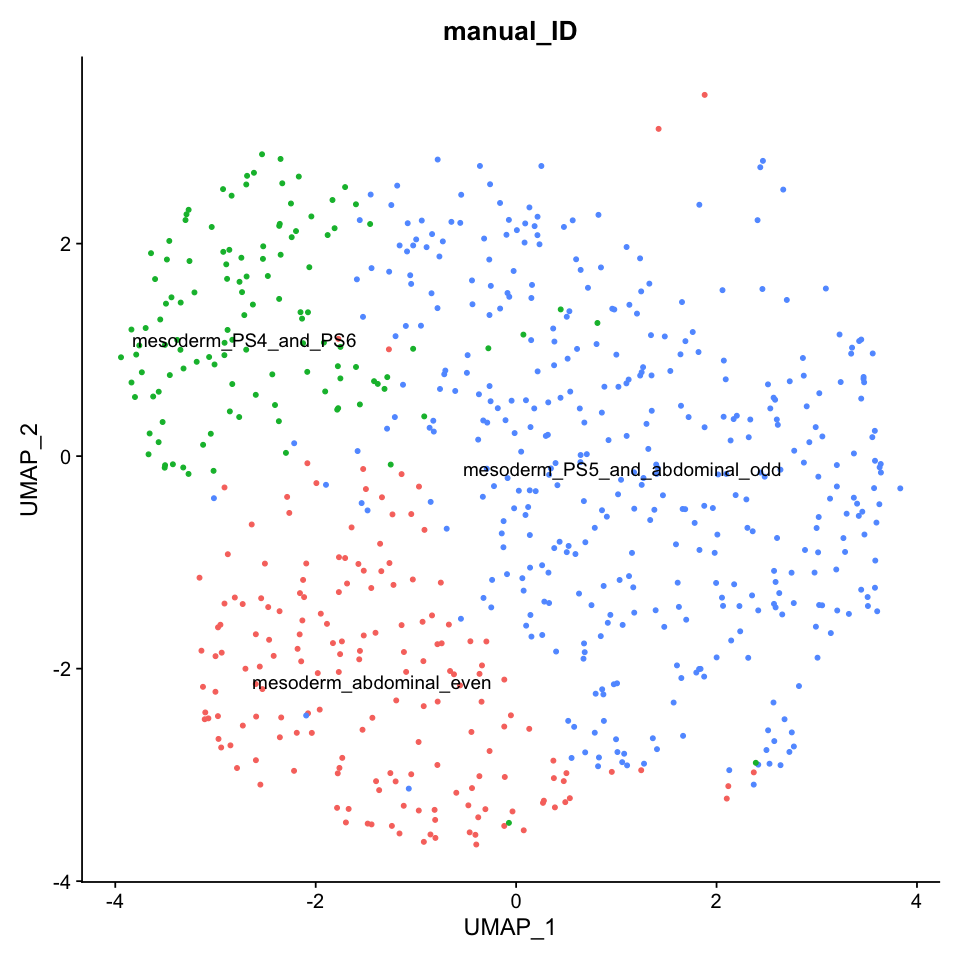

In [40]:
seu.trunk.meso.wo.c4$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso.wo.c4, reduction = 'umap', label = TRUE, group.by = 'manual_ID') + NoLegend()

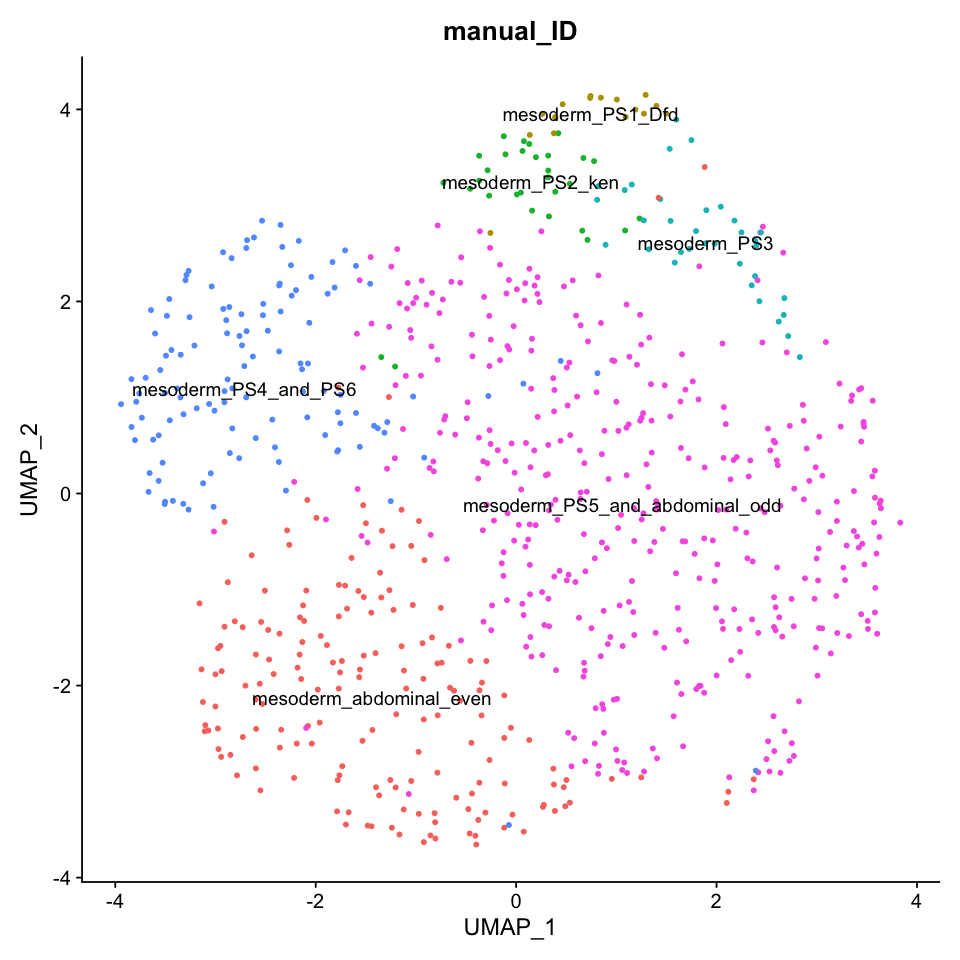

In [41]:
seu.merge <- merge(seu.trunk.meso.c4,seu.trunk.meso.wo.c4)
seu.trunk.meso$manual_ID <- seu.merge$manual_ID
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso, reduction = 'umap', label = TRUE, group.by = 'manual_ID') + NoLegend()

In [42]:
Idents(seu.trunk.meso) <- 'manual_ID'
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster mesoderm_PS5_and_abdominal_odd

Calculating cluster mesoderm_PS4_and_PS6

Calculating cluster mesoderm_abdominal_even

Calculating cluster mesoderm_PS3

Calculating cluster mesoderm_PS2_ken

Calculating cluster mesoderm_PS1_Dfd



[1] 275

[1] 60

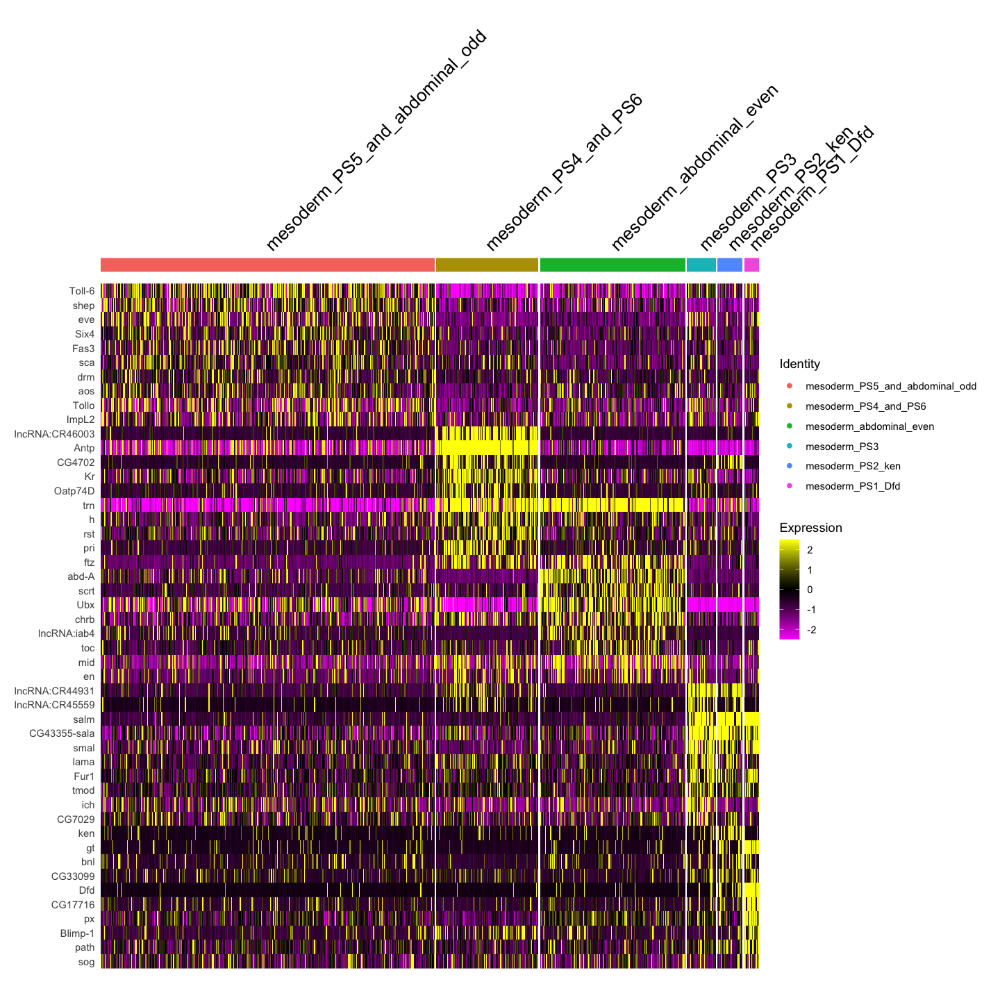

In [43]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c(all.markers.meso.top10$gene))

Saving 7 x 7 in image



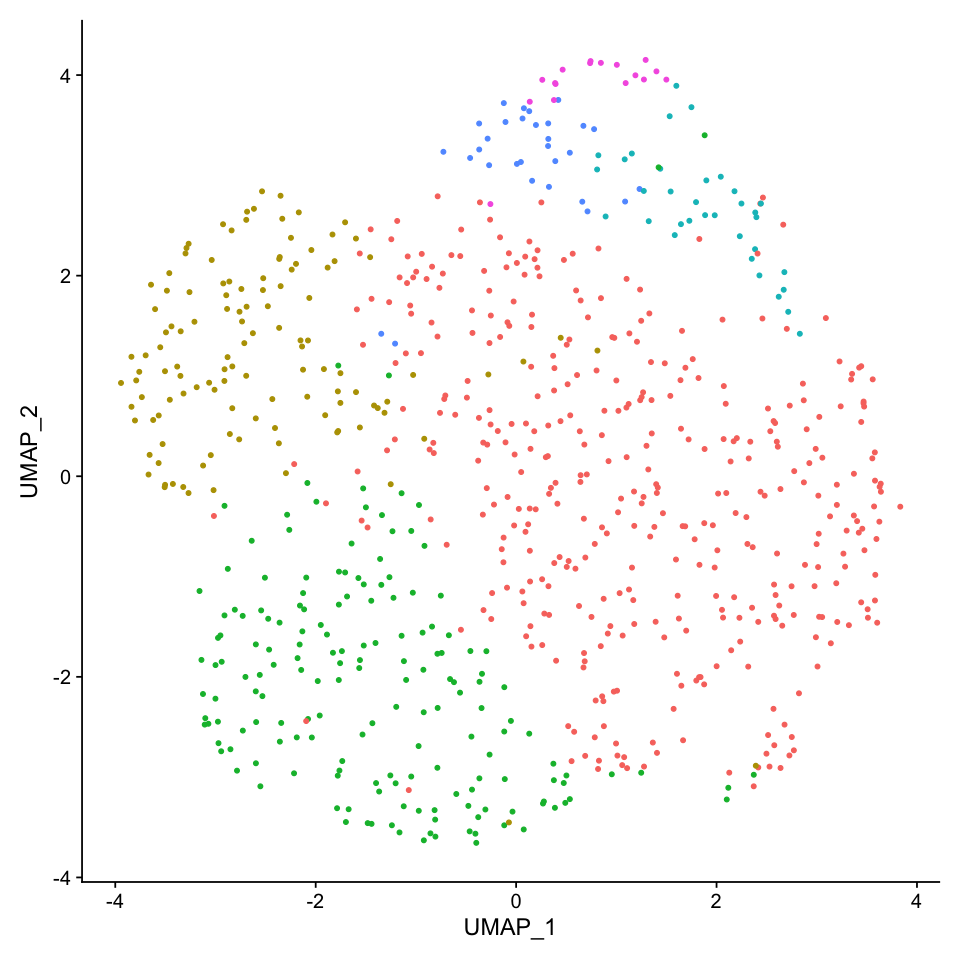

In [44]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/trunk_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



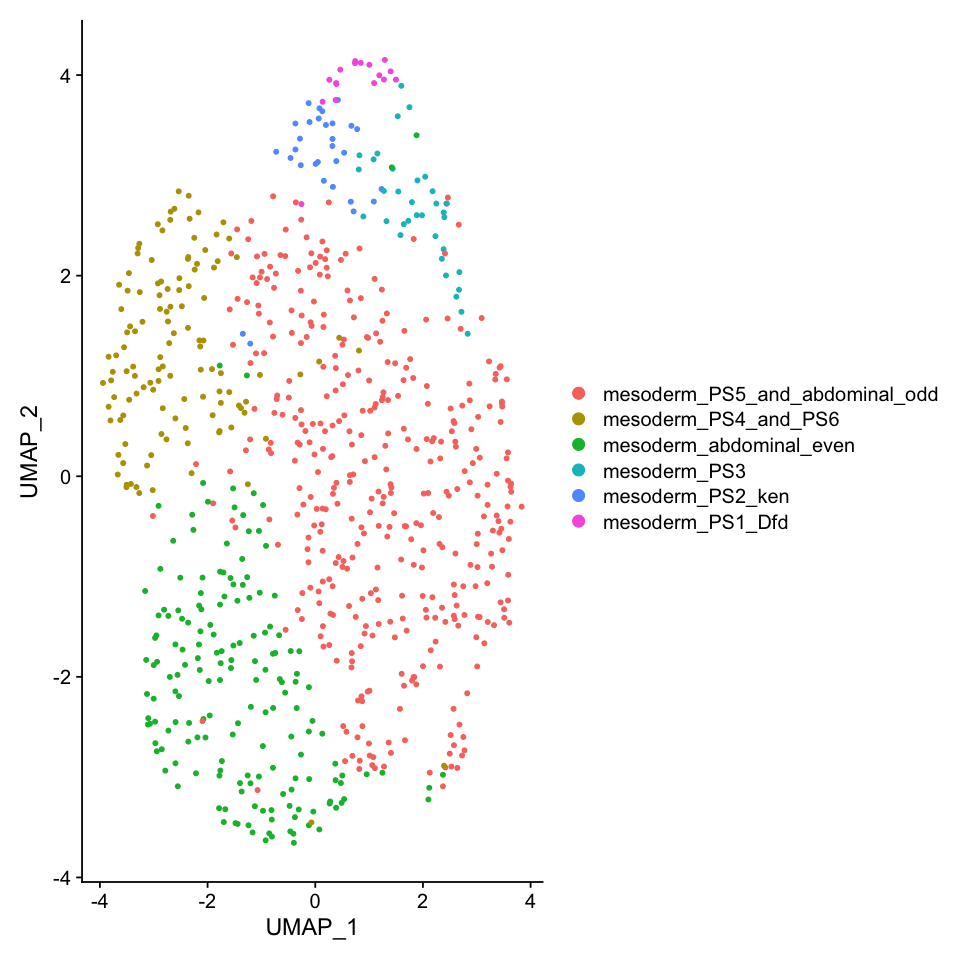

In [45]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/trunk_meso_umap2.eps", dpi = 300)

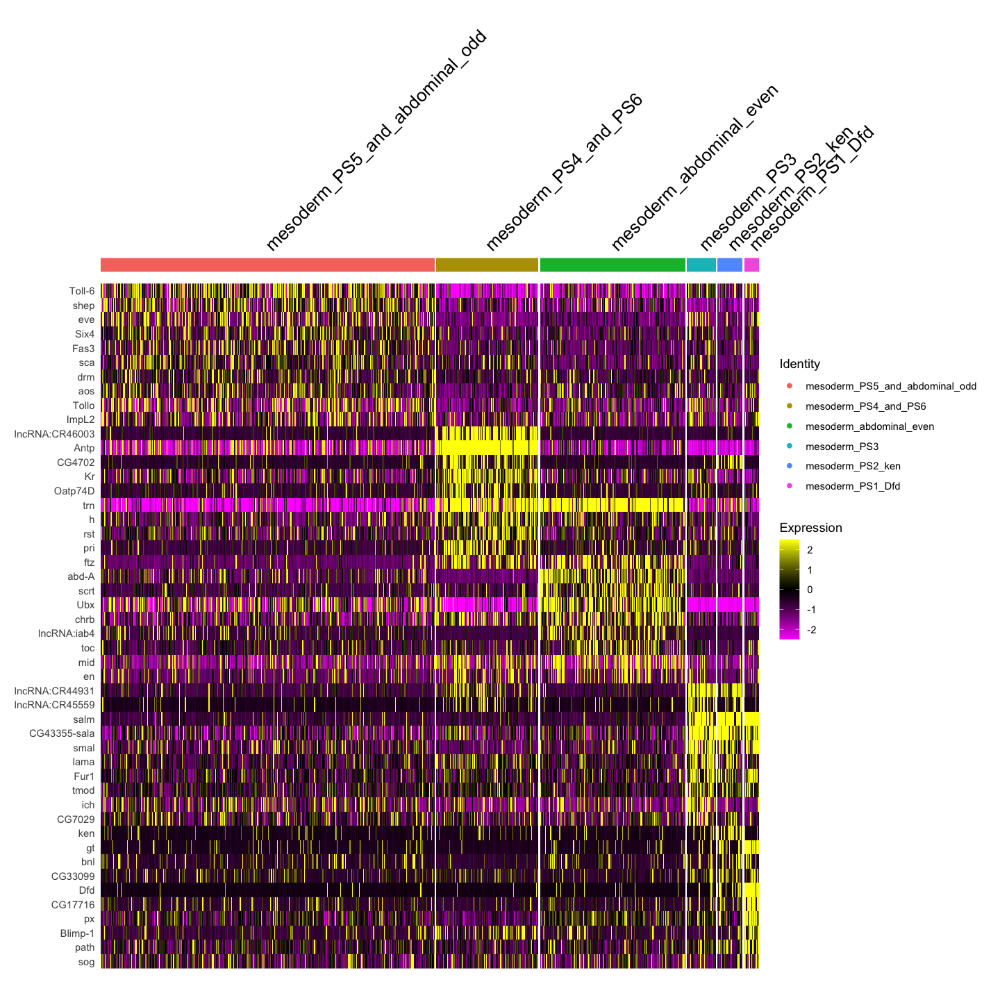

In [46]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.trunk.meso, features = c(all.markers.meso.top10$gene))
fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/trunk_meso_manualID_heatmap_renorm.eps", dpi = 300,  width = 12, height = 8)

## Anterior mesoderm (gcm+)
### picking up target cells

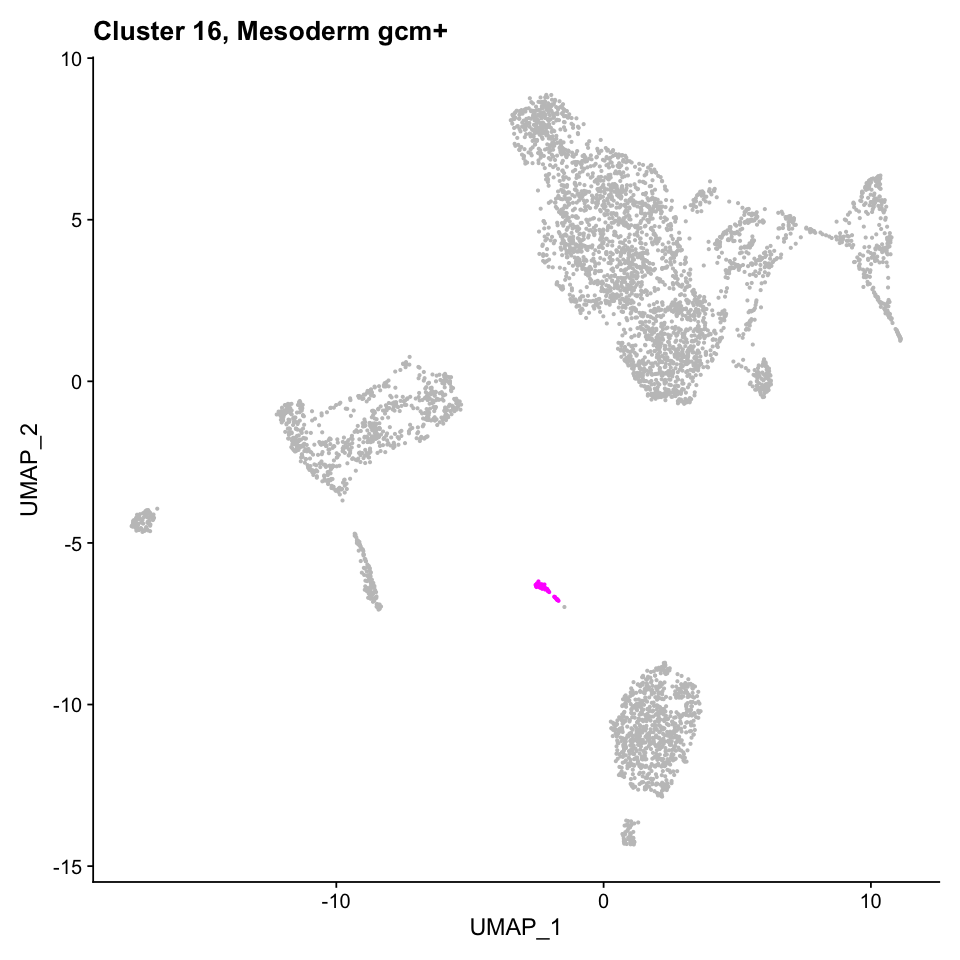

In [47]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(16))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 16, Mesoderm gcm+')

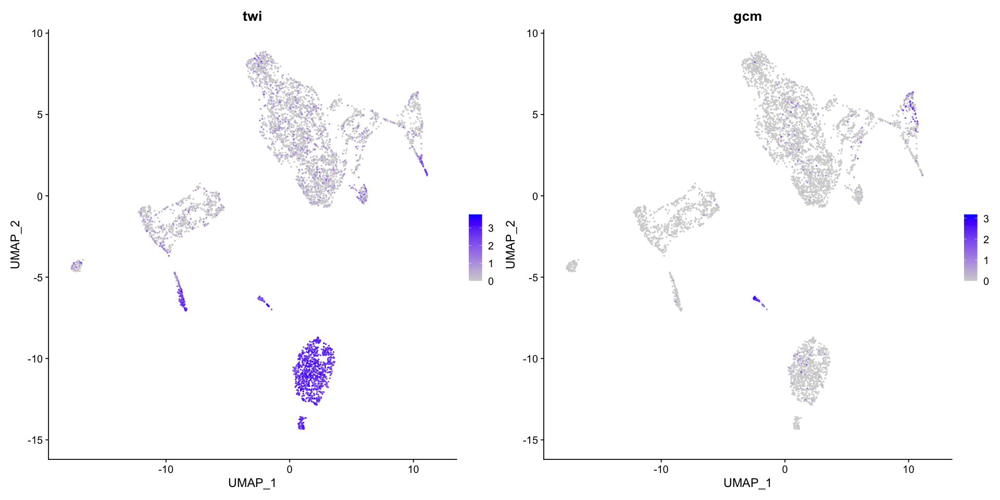

In [48]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'gcm'))

In [49]:
seu.meso.gcm <- subset(seu_HQC, ident = 16)
seu.meso.gcm

An object of class Seurat 
28364 features across 52 samples within 2 assays 
Active assay: SCT (10860 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
Warning message in irlba(A = t(x = object), nv = npcs, ...):
“did not converge--results might be invalid!; try increasing work or maxit”
PC_ 1 
Positive:  knrl, ham, shep, kni, zfh1, gcm, CrebA, Ilp4, Pka-C3, ttk 
	   hll, CG10570-CG42502, srp, Mes2, RhoL, CG12177, fok, Pvr, sna, twi 
	   bnl, VepD, Npc2g, Mdr49, kn, NetB, CG33099, ltl, Cyp305a1, be 
Negative:  ImpL2, CG10035, Tom, Antp, Lac, E(spl)m4-BFM, sog, Brd, CG13427, BobA 
	   Tet, salm, tsh, Ubx, ths, hth, sca, mirr, aop, cv-2 
	   D, Egfr, blot, E(spl)malpha-BFM, ASPP, lncRNA:bxd, mid, dpp, CG34224, grh 
PC_ 2 
Positive:  ttk, srp, fok, bnl, cv-d, Cyp305a1, Pvr, Npc2g, RhoL, CG42792 
	   cv-c, Glut4EF, Nplp2, ush, CG16886, CG16758, Gbs-70E, dve, SoxN, CG4829 
	   cwo, CG30069, Oatp74D, Mdr49, CG9005, CrebA, DNaseII, bgm, Sr-CI, beat-Ia 
Negative:  gt, twi, kn, Dfd, smal, 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 52
Number of edges: 1326

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2000
Number of communities: 1
Elapsed time: 0 seconds


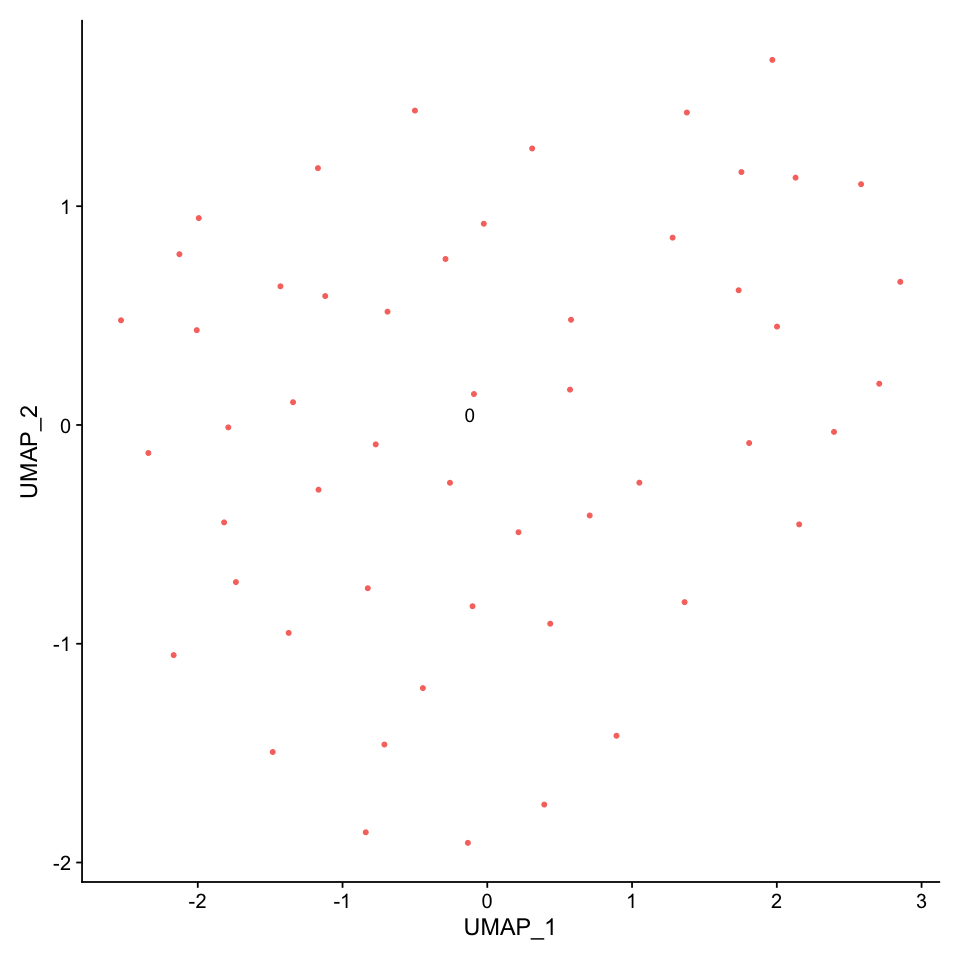

In [50]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.gcm <- RunPCA(seu.meso.gcm)
seu.meso.gcm <- RunUMAP(seu.meso.gcm, dims = 1:30)
seu.meso.gcm <- FindNeighbors(seu.meso.gcm, dims = 1:30)
seu.meso.gcm <- FindClusters(seu.meso.gcm)
DimPlot(seu.meso.gcm, reduction = 'umap', label = TRUE) + NoLegend()

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 52
Number of edges: 1326

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.0710
Number of communities: 2
Elapsed time: 0 seconds


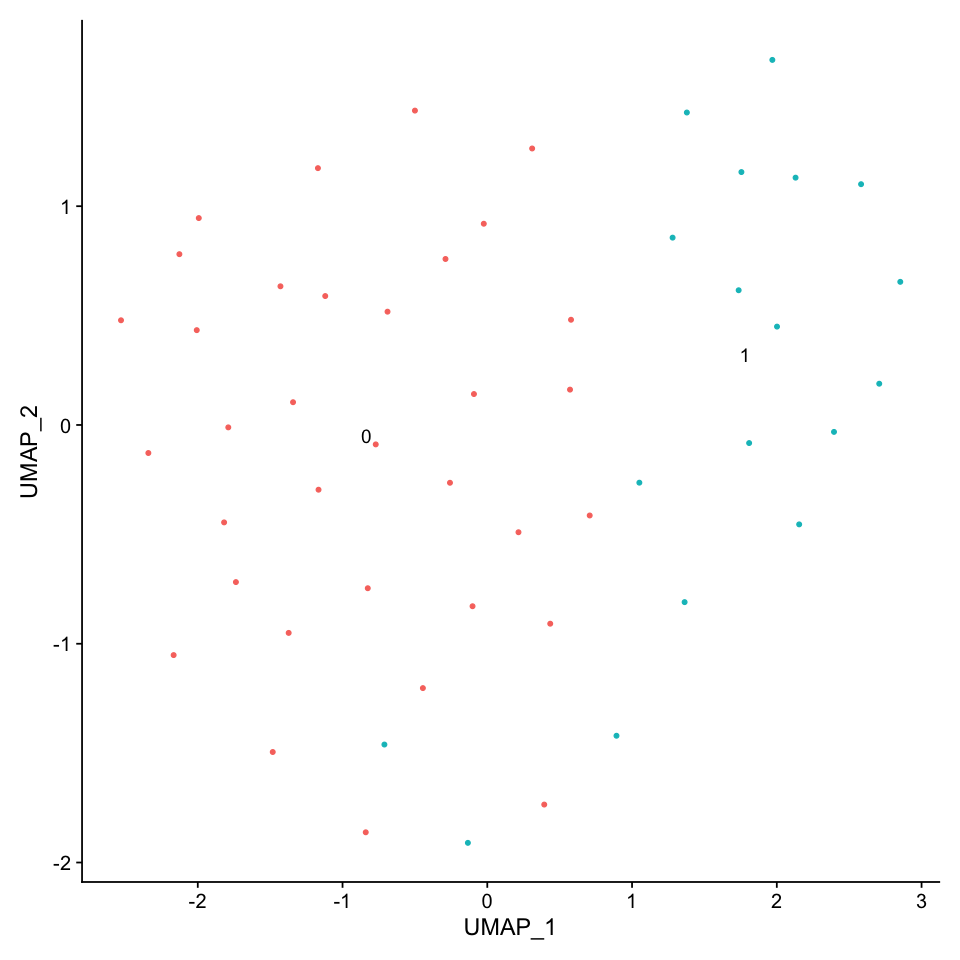

In [51]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.gcm <- FindClusters(seu.meso.gcm,resolution = 1.0)
DimPlot(seu.meso.gcm, reduction = 'umap', label = TRUE) + NoLegend()

In [52]:
all.markers.meso <- FindAllMarkers(object = seu.meso.gcm, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1



[1] 183

[1] 20

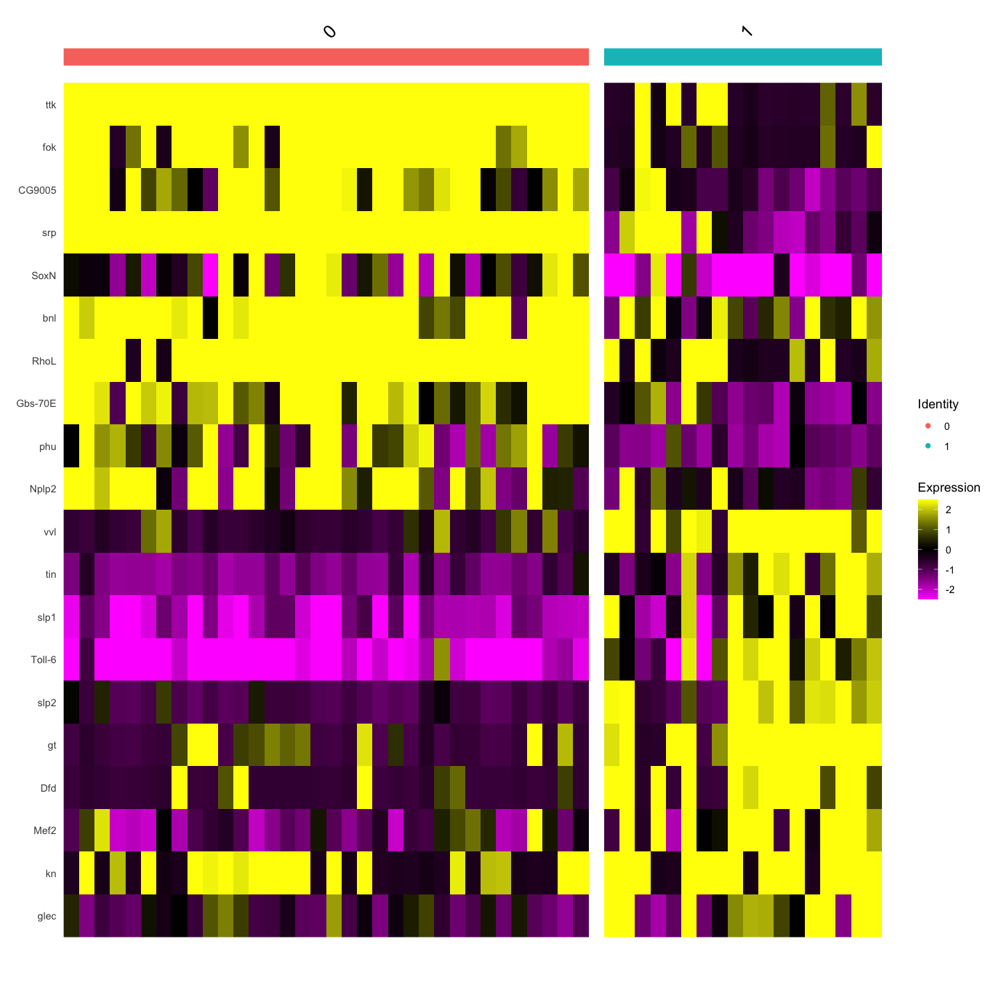

In [53]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.meso.gcm, features = c(all.markers.meso.top10$gene))

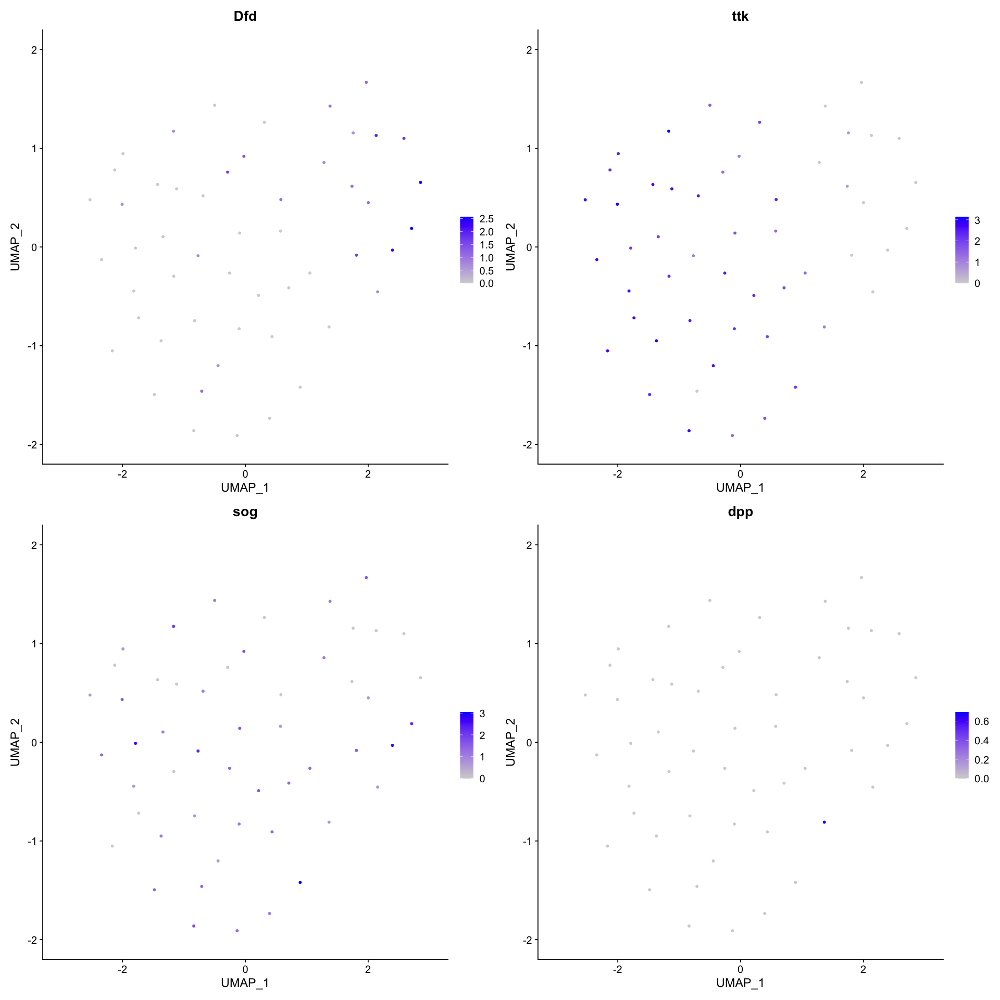

In [54]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.meso.gcm, reduction = 'umap', features = c('Dfd', 'ttk','sog','dpp'))

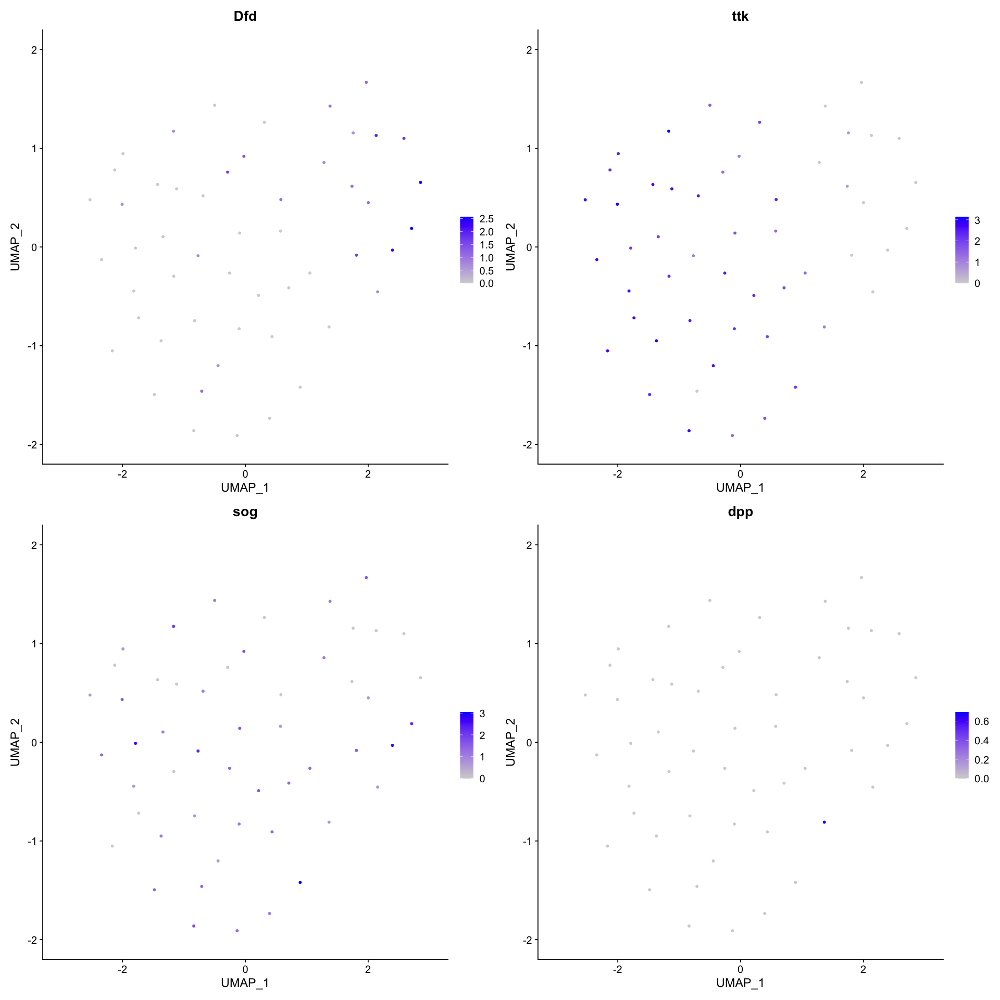

In [55]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.meso.gcm, reduction = 'umap', features = c('Dfd', 'ttk','sog','dpp'))

### Add annotation

,manual_ID
,<fct>
AACCATGGTGGTTTAC,1
AACCTGAAGACAAGCC,0
AAGCGTTCAAAGAACT,0
AATCGACCACCAGTAT,1
AGACAGGAGGTTCTTG,0
AGGATAACACTTGAGT,1


,manual_ID
,<chr>
AACCATGGTGGTTTAC,mesoderm_gcm_Dfd
AACCTGAAGACAAGCC,mesoderm_gcm
AAGCGTTCAAAGAACT,mesoderm_gcm
AATCGACCACCAGTAT,mesoderm_gcm_Dfd
AGACAGGAGGTTCTTG,mesoderm_gcm
AGGATAACACTTGAGT,mesoderm_gcm_Dfd


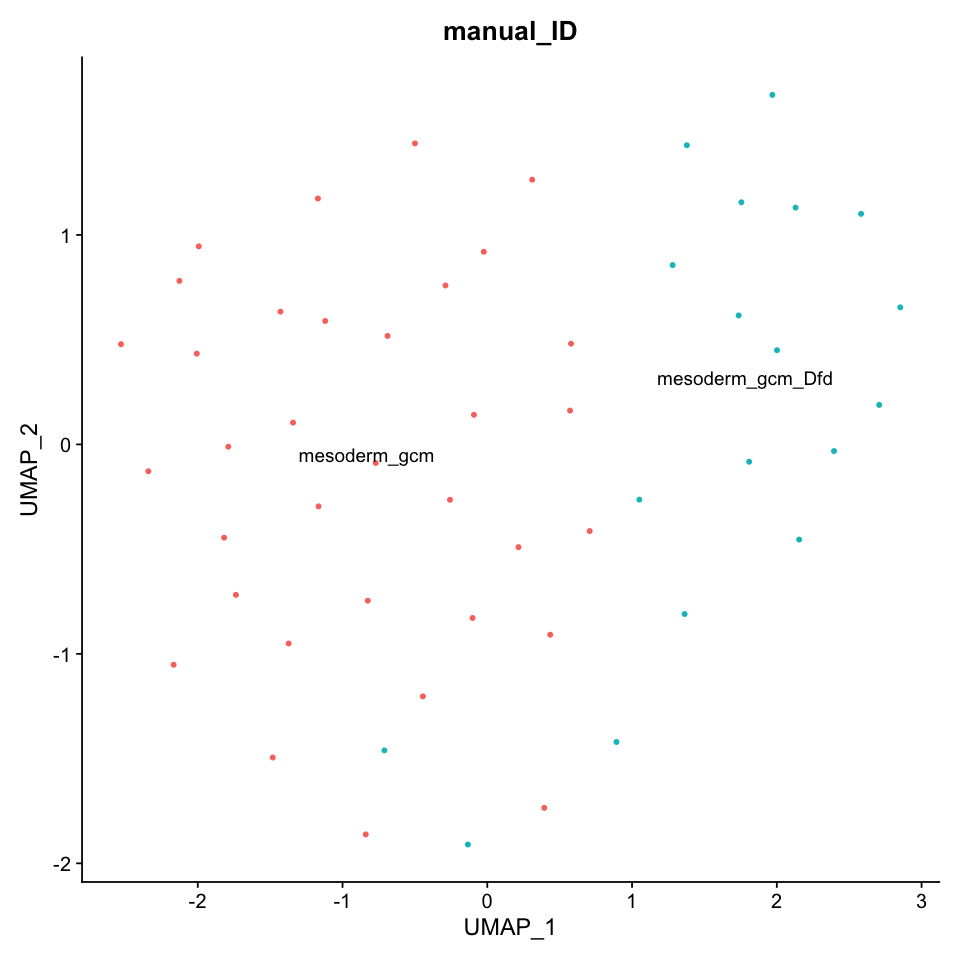

In [56]:
manual_id <- as.data.frame(seu.meso.gcm$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID <- gsub("0", "mesoderm_gcm", manual_id$manual_ID) #Dfd-
manual_id$manual_ID <- gsub("1", "mesoderm_gcm_Dfd", manual_id$manual_ID) #Dfd+
head(manual_id)
seu.meso.gcm$manual_ID <- manual_id$manual_ID
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.meso.gcm, reduction = 'umap', label = TRUE, group.by = 'manual_ID') + NoLegend()

In [57]:
Idents(seu.meso.gcm) <- 'manual_ID'

Saving 7 x 7 in image



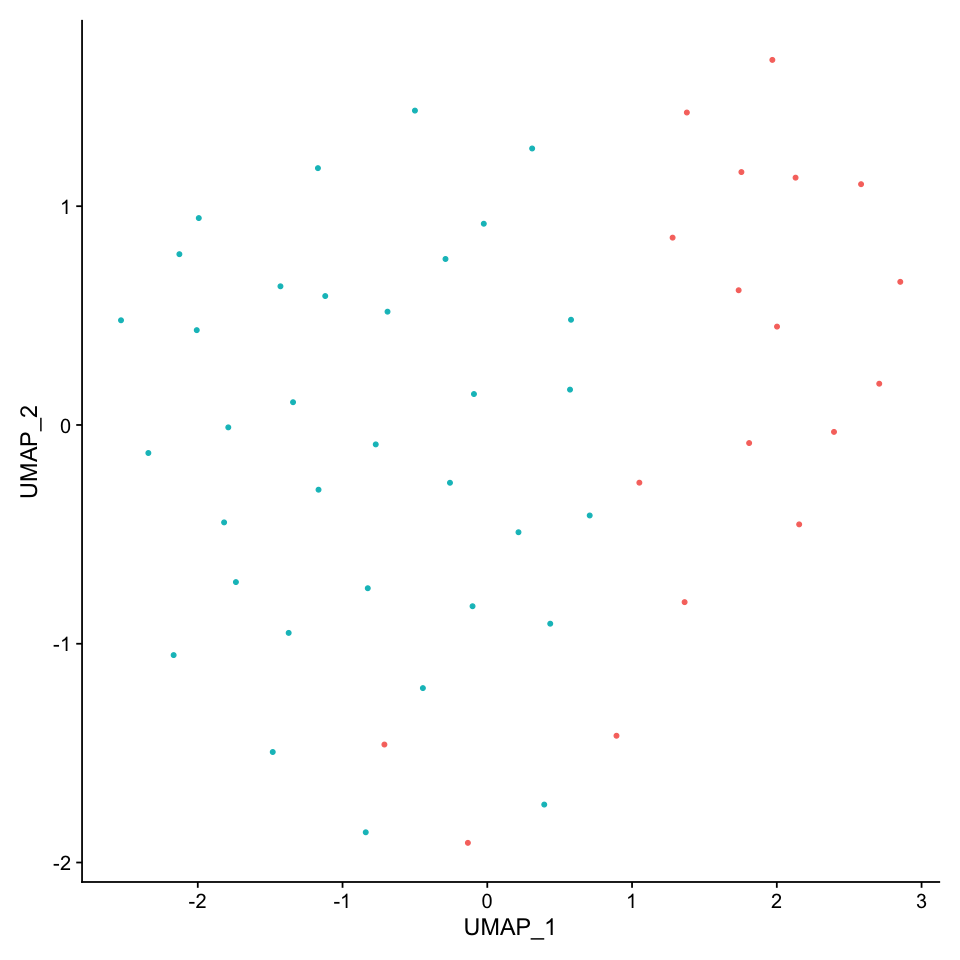

In [58]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.gcm, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/meso_gcm_umap1.eps", dpi = 300)

Saving 7 x 7 in image



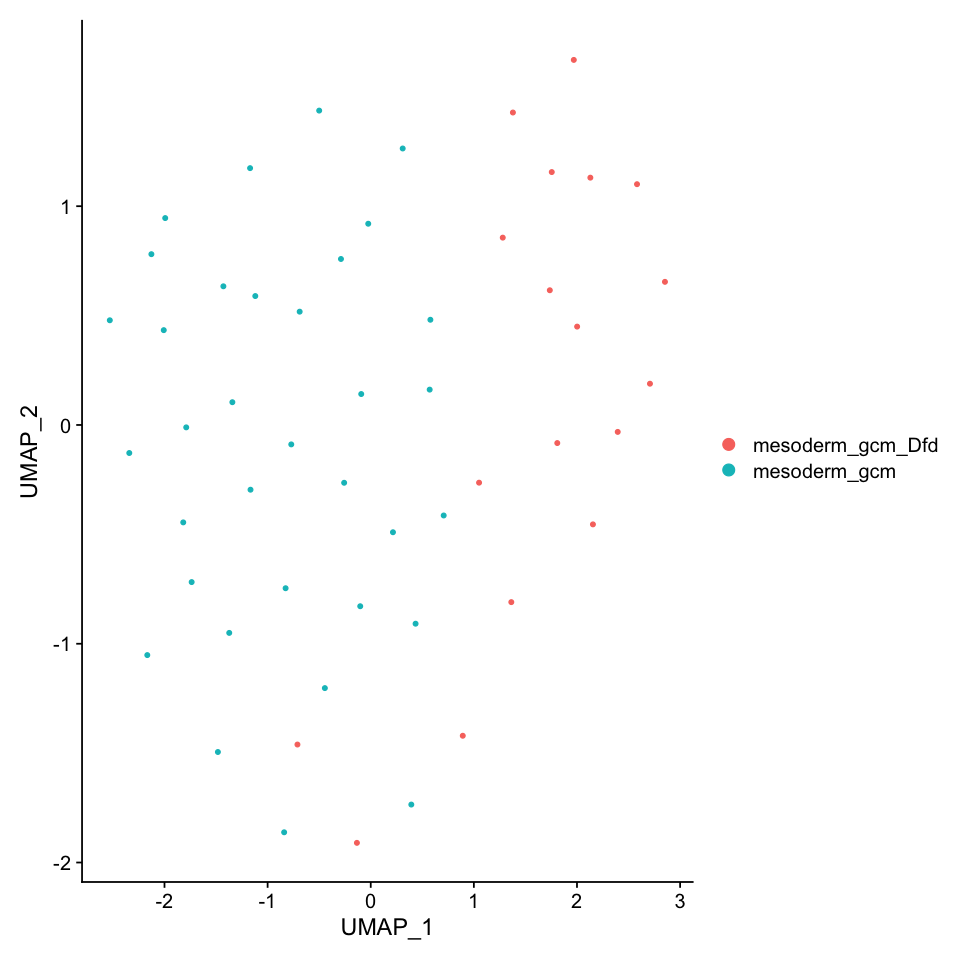

In [59]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.gcm, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/meso_gcm_umap2.eps", dpi = 300)

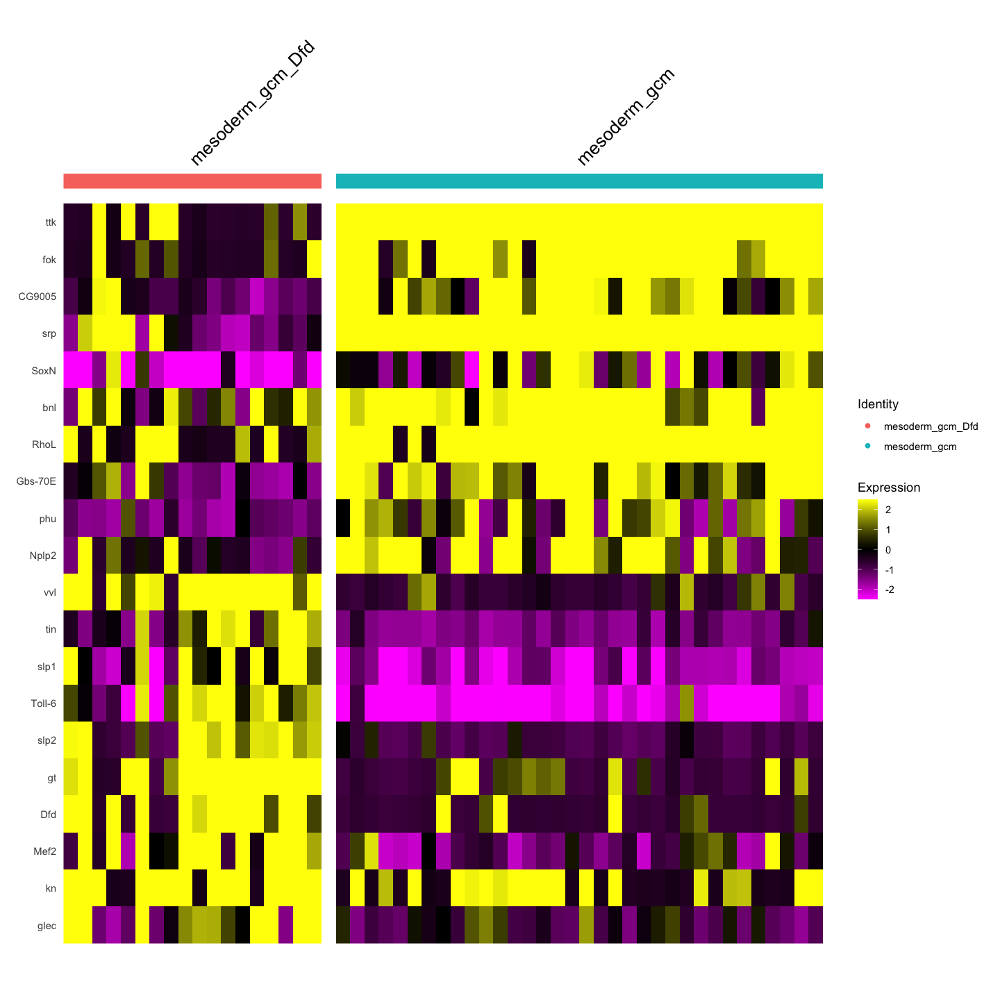

In [60]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.meso.gcm, features = c(all.markers.meso.top10$gene))
fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/meso_gcm_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## Posterior mesoderm
### picking up target clusters

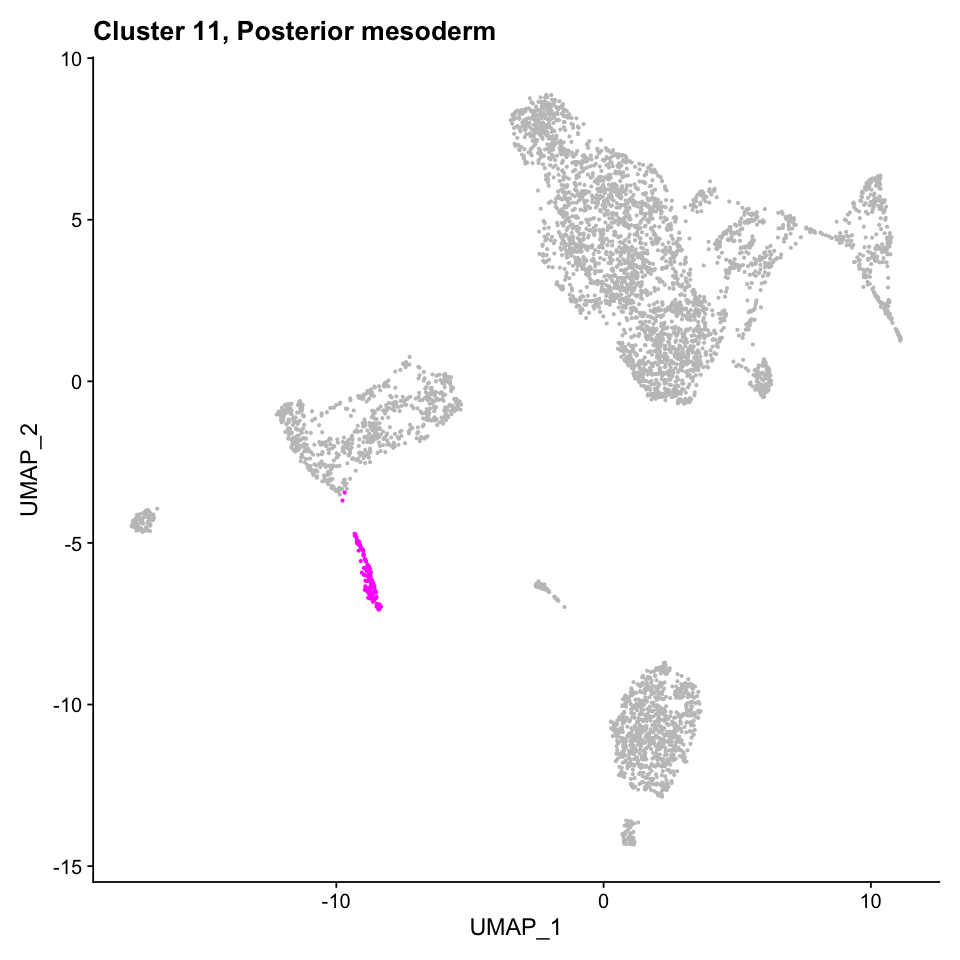

In [61]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(11))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 11, Posterior mesoderm')

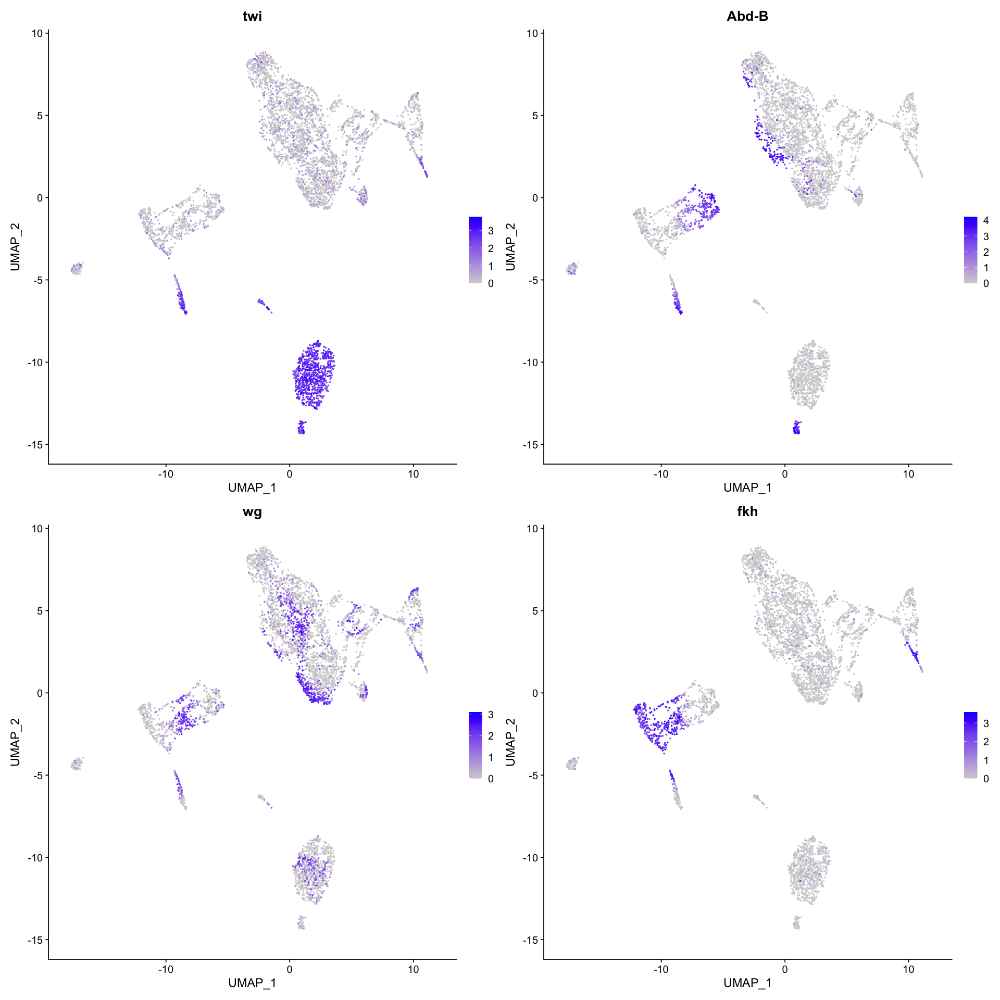

In [62]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'Abd-B', 'wg','fkh'))

In [63]:
seu.meso.post <- subset(seu_HQC, ident = 11)
seu.meso.post

An object of class Seurat 
28364 features across 109 samples within 2 assays 
Active assay: SCT (10860 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

PC_ 1 
Positive:  SoxN, hth, Brd, Tom, BobA, ImpL2, sog, Lac, Ilp4, ths 
	   E(spl)m4-BFM, Ubx, CG15628, E(spl)mgamma-HLH, Antp, CG13427, Toll-6, E(spl)malpha-BFM, mirr, Tollo 
	   tsh, blot, aop, cv-2, slp1, ASPP, CG13217, CG34224, E(spl)m7-HLH, Egfr 
Negative:  salm, disco, sna, zfh1, ken, Abd-B, CG43355-sala, lncRNA:iab8, Blimp-1, twi 
	   byn, D, rib, CadN, Mes2, Ndae1, bab2, Ama, Mef2, ftz 
	   Oatp74D, GlcAT-P, VepD, HLH54F, DIP-epsilon, chrb, Nplp2, CG16758, SNCF, hb 
PC_ 2 
Positive:  Abd-B, ken, ftz, CadN, Blimp-1, D, twi, lncRNA:iab8, NetA, Oatp74D 
	   htl, Mef2, prd, ich, trn, FoxL1, salm, chrb, wb, hb 
	   ptc, if, en, tin, dpn, mthl1, pigs, sprt, scrt, CG32982 
Negative:  fkh, HLH54F, GlcAT-P, Gmap, disco, Fas2, byn, so, Sema5c, Notum 
	   rib, CG5002, Ndae1, wg, CG16758, Pepck-CG45087, CG2930, CG7029, cv-c, luna 
	   bru3, Nplp2, btl, CG43355-sala, bab2, srp, Cyp305a1, Cpr78Cb, CG30015, sna 
PC_ 3 
Positive:  Oatp74D, chrb, fkh, Gmap, trn, Fas2, sprt, scyl, ftz, ich 
	  

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 109
Number of edges: 3873

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.4212
Number of communities: 2
Elapsed time: 0 seconds


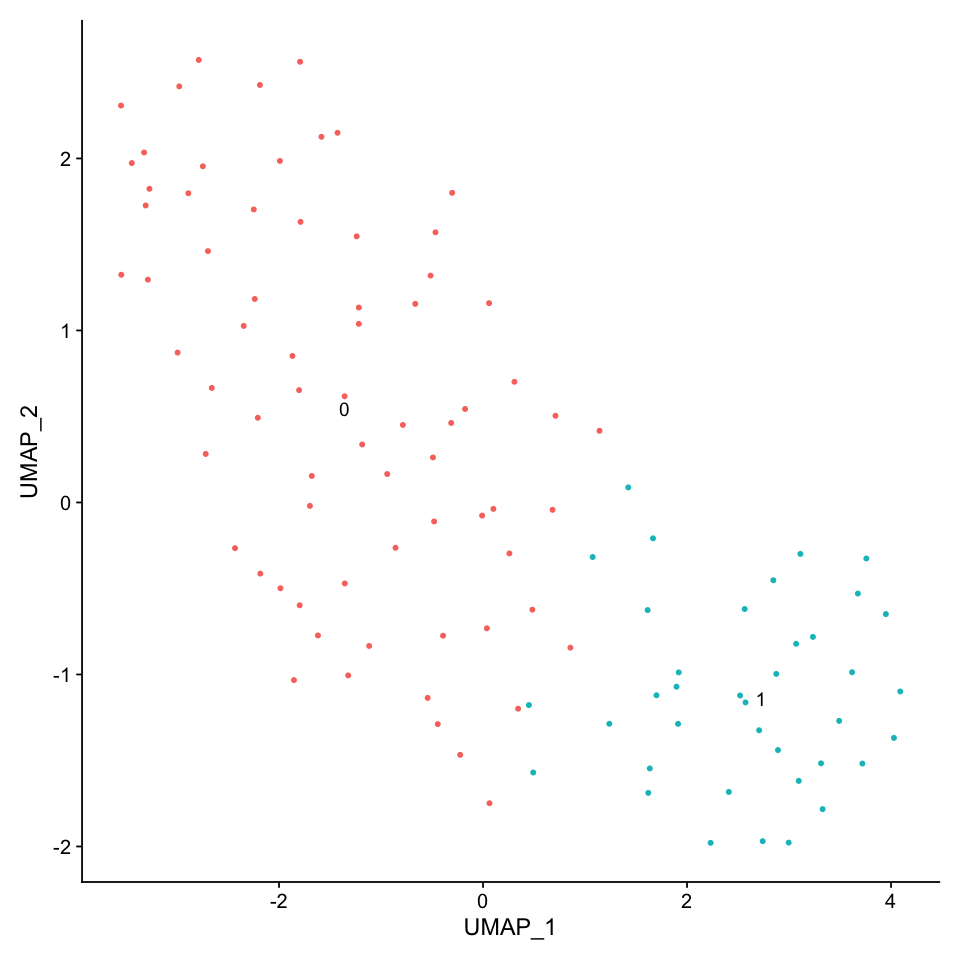

In [64]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.post <- RunPCA(seu.meso.post)
seu.meso.post <- RunUMAP(seu.meso.post, dims = 1:30)
seu.meso.post <- FindNeighbors(seu.meso.post, dims = 1:30)
seu.meso.post <- FindClusters(seu.meso.post)
DimPlot(seu.meso.post, reduction = 'umap', label = TRUE) + NoLegend()

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 109
Number of edges: 3873

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2222
Number of communities: 4
Elapsed time: 0 seconds


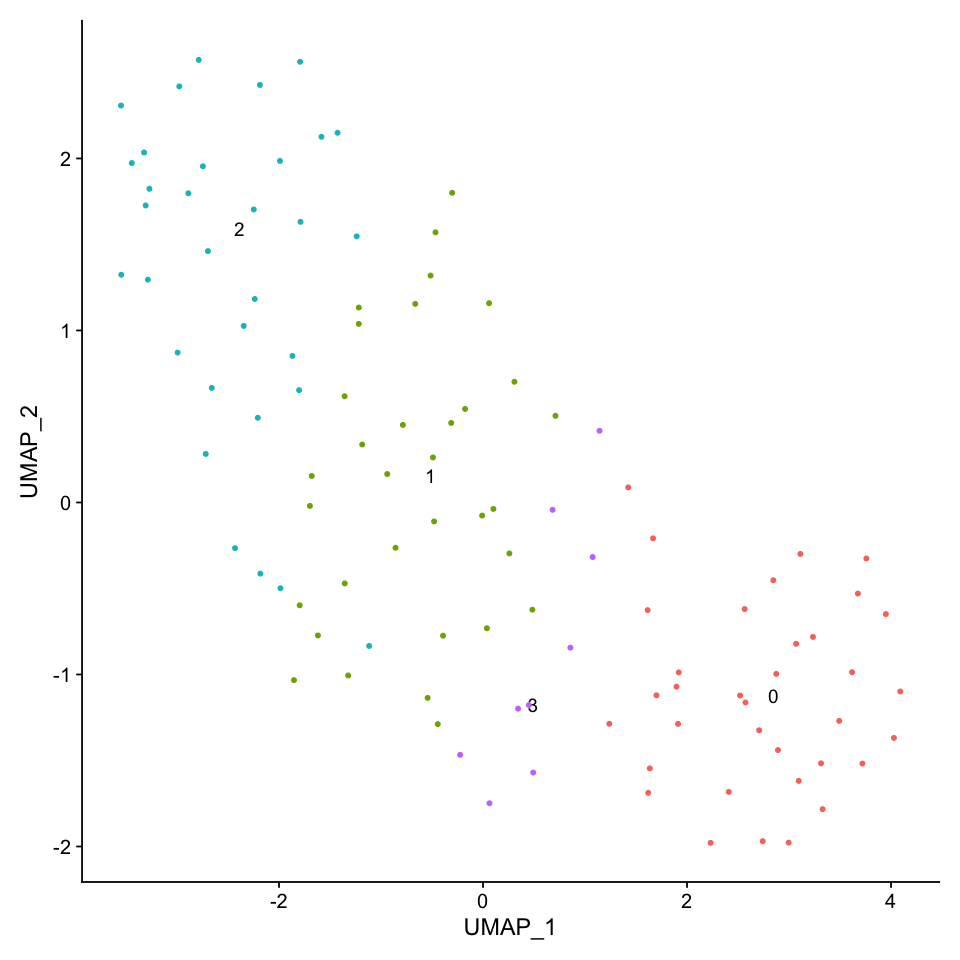

In [65]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.post <- FindClusters(seu.meso.post, resolution = 1.3)
DimPlot(seu.meso.post, reduction = 'umap', label = TRUE) + NoLegend()

In [66]:
levels(seu.meso.post) <- c(2,1,3,0)
all.markers.meso <- FindAllMarkers(object = seu.meso.post, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 2

Calculating cluster 1

Calculating cluster 3

Calculating cluster 0



[1] 301

[1] 40

Warning message in DoHeatmap(seu.meso.post, features = c(all.markers.meso.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: Csp, HipHop, gbb, SmE, CG34183, Clp, CG34404”


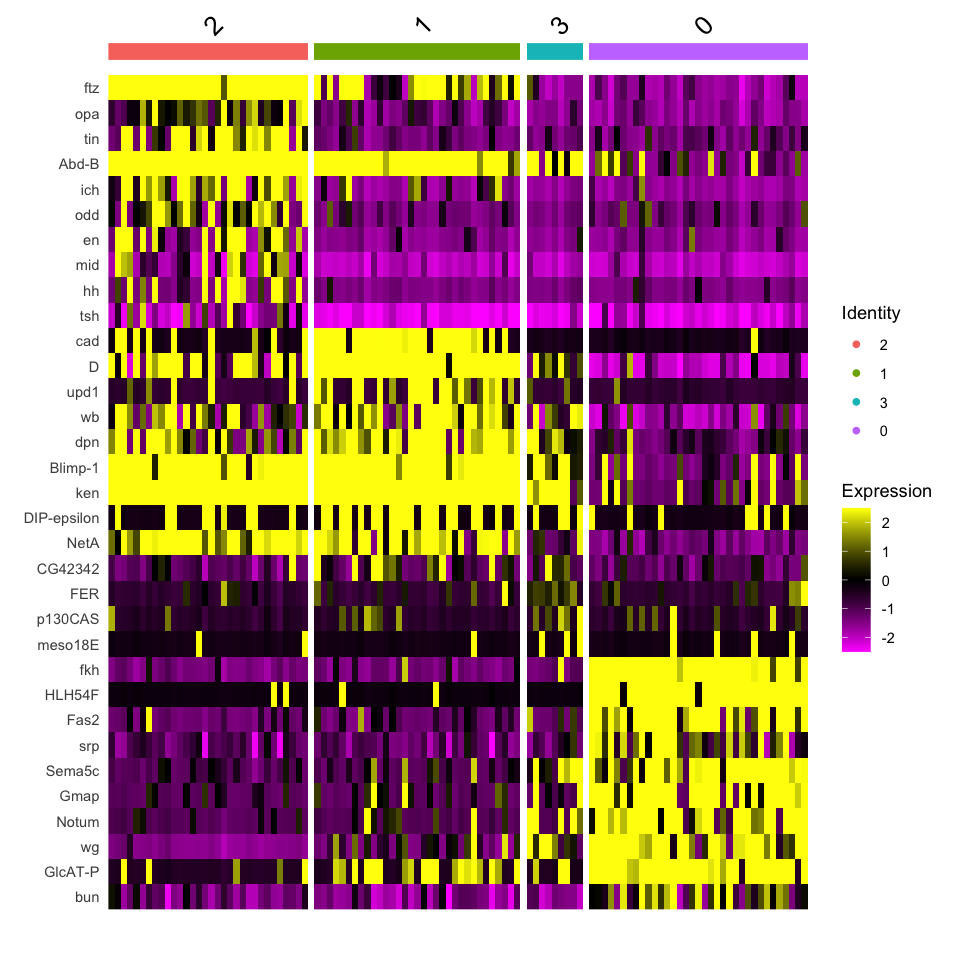

In [67]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.meso.post, features = c(all.markers.meso.top10$gene))

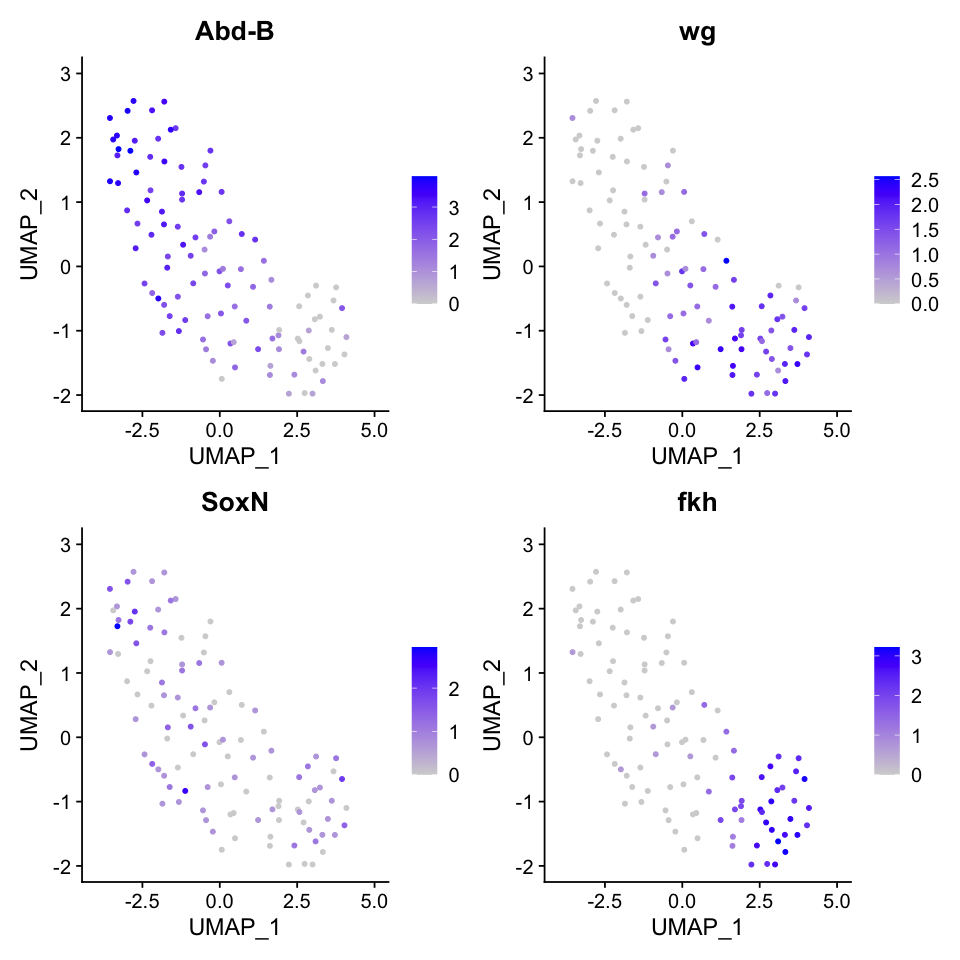

In [68]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.meso.post, reduction = 'umap', features = c('Abd-B', 'wg','SoxN','fkh'))

### Add annotation

In [69]:
manual_id <- as.data.frame(seu.meso.post$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)

manual_id$manual_ID <- gsub("0", "mesoderm_caudal_visceral", manual_id$manual_ID) #Abd-B-, fkh+
manual_id$manual_ID <- gsub("1", "mesoderm_PS14", manual_id$manual_ID) #Abd-B+, fkh-
manual_id$manual_ID <- gsub("2", "mesoderm_PS14", manual_id$manual_ID) #Abd-B+, fkh-
manual_id$manual_ID <- gsub("3", "mesoderm_PS14", manual_id$manual_ID) #Abd-B+, fkh-, wg+

head(manual_id)

,manual_ID
,<fct>
AAAGGTAAGATTCGCT,2
AAAGTCCGTCCTGGGT,1
AAAGTGATCTGGGTCG,2
AACCTTTTCCGATAGT,1
AACGTCATCAGGAACG,1
AAGGTAACACGTATAC,0


,manual_ID
,<chr>
AAAGGTAAGATTCGCT,mesoderm_PS14
AAAGTCCGTCCTGGGT,mesoderm_PS14
AAAGTGATCTGGGTCG,mesoderm_PS14
AACCTTTTCCGATAGT,mesoderm_PS14
AACGTCATCAGGAACG,mesoderm_PS14
AAGGTAACACGTATAC,mesoderm_caudal_visceral


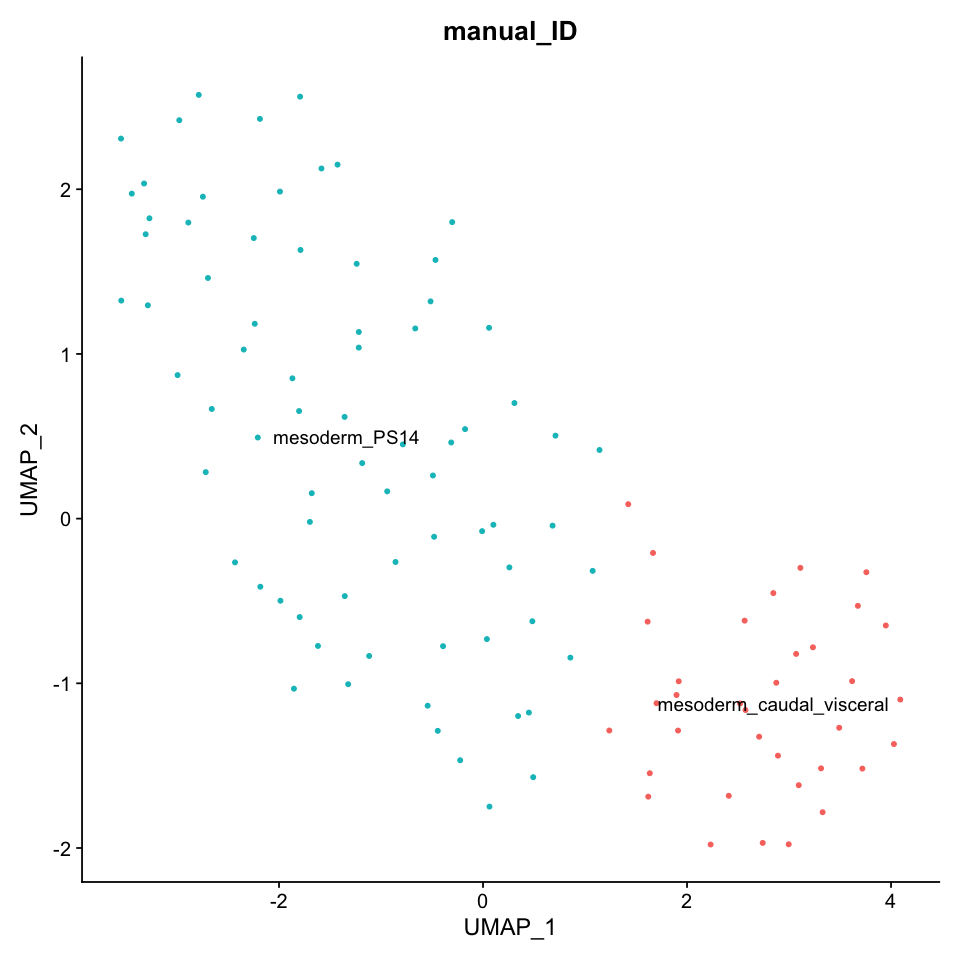

In [70]:
seu.meso.post$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.meso.post, reduction = 'umap', label = TRUE, group.by = 'manual_ID') + NoLegend()

In [71]:
Idents(seu.meso.post) <- 'manual_ID'
all.markers.meso <- FindAllMarkers(object = seu.meso.post, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster mesoderm_PS14

Calculating cluster mesoderm_caudal_visceral



[1] 218

[1] 20

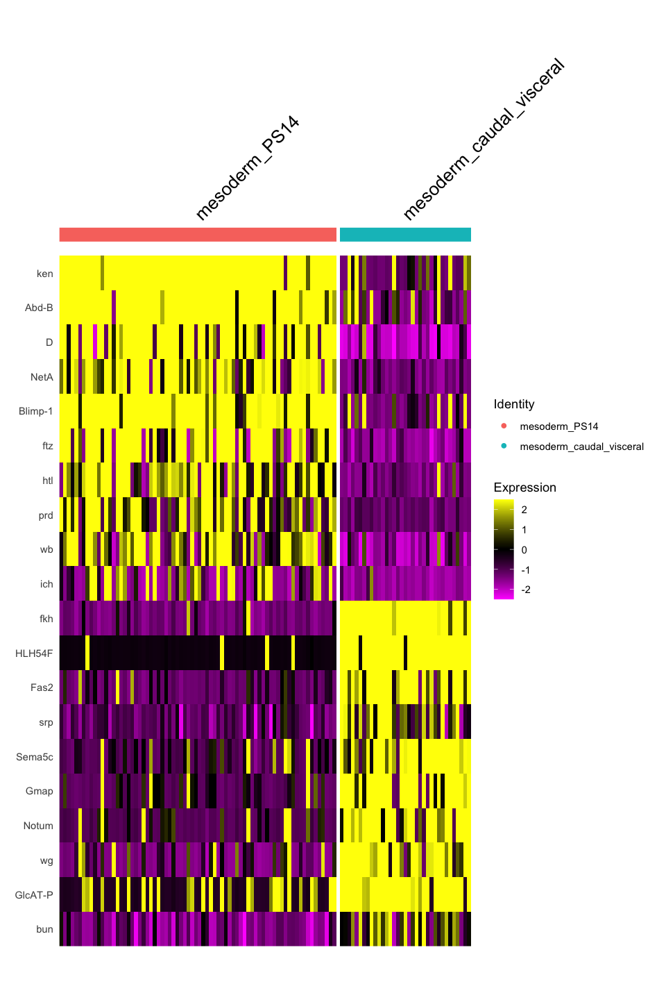

In [72]:
options(repr.plot.width=8, repr.plot.height=12)
DoHeatmap(seu.meso.post, features = c(all.markers.meso.top10$gene))

Saving 7 x 7 in image



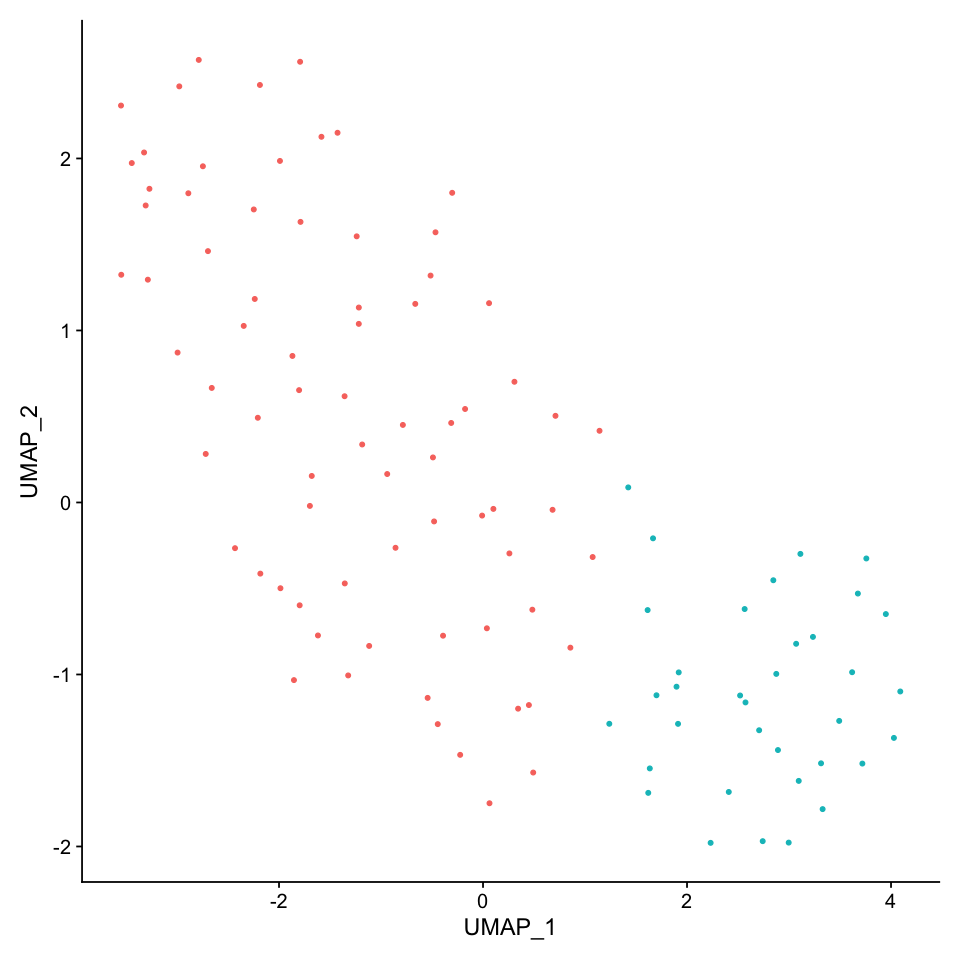

In [73]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.post, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/post_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



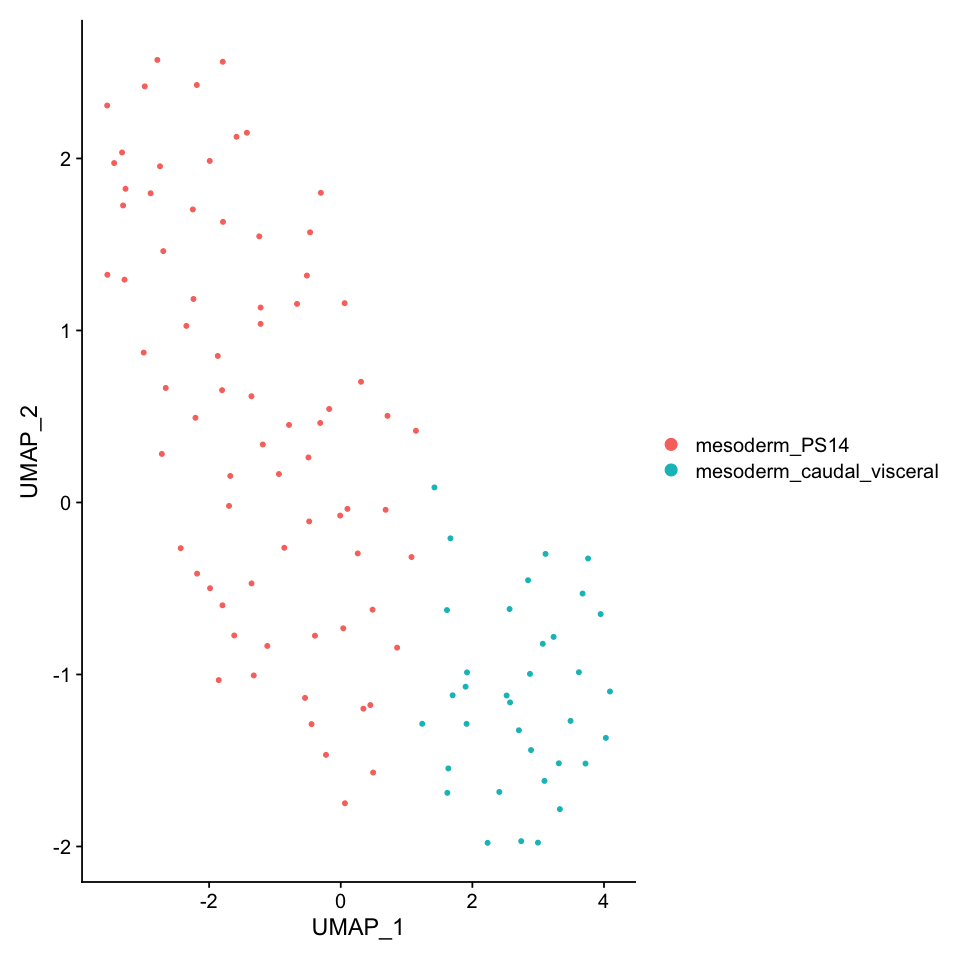

In [74]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.post, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/post_meso_umap2.eps", dpi = 300)

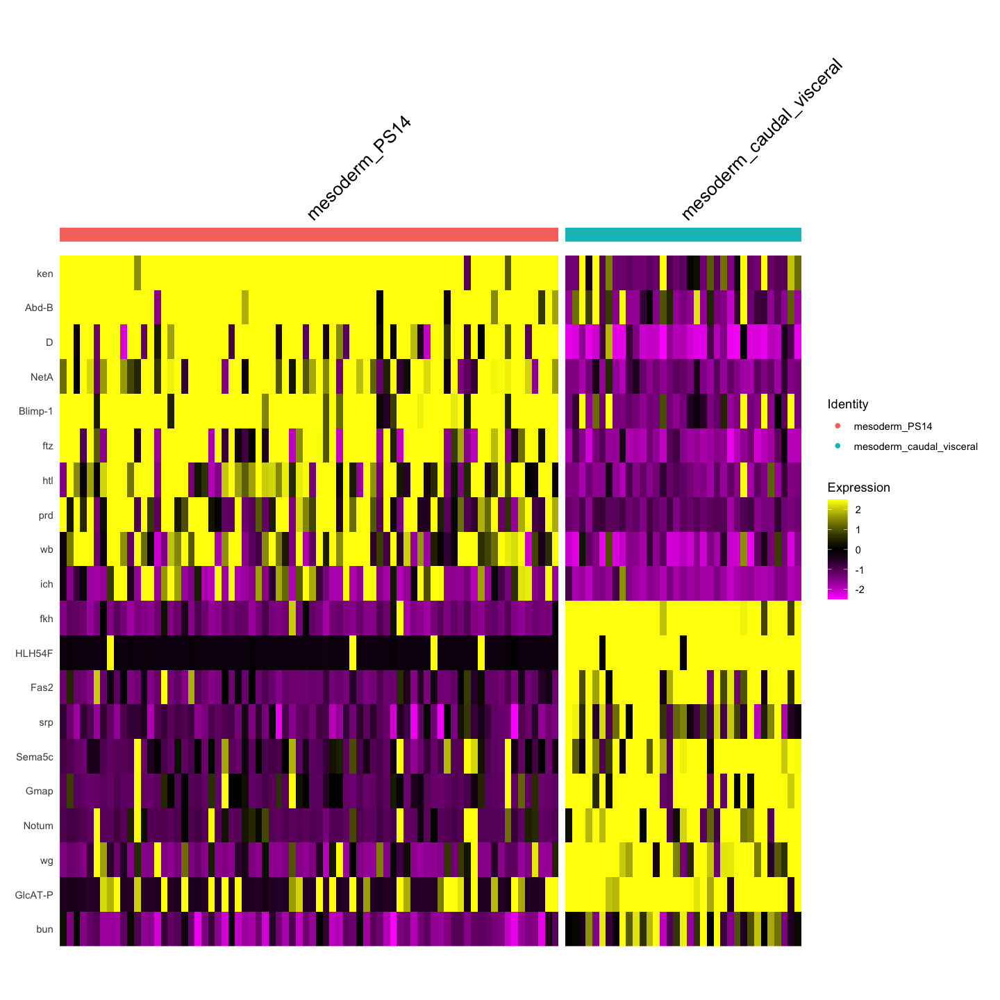

In [75]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.meso.post, features = c(all.markers.meso.top10$gene))
fig
ggsave(fig, file = "./figures/07_mesoderm_subclutering_Set2/post_meso_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## mesoderm PS13
### picking up target clusters

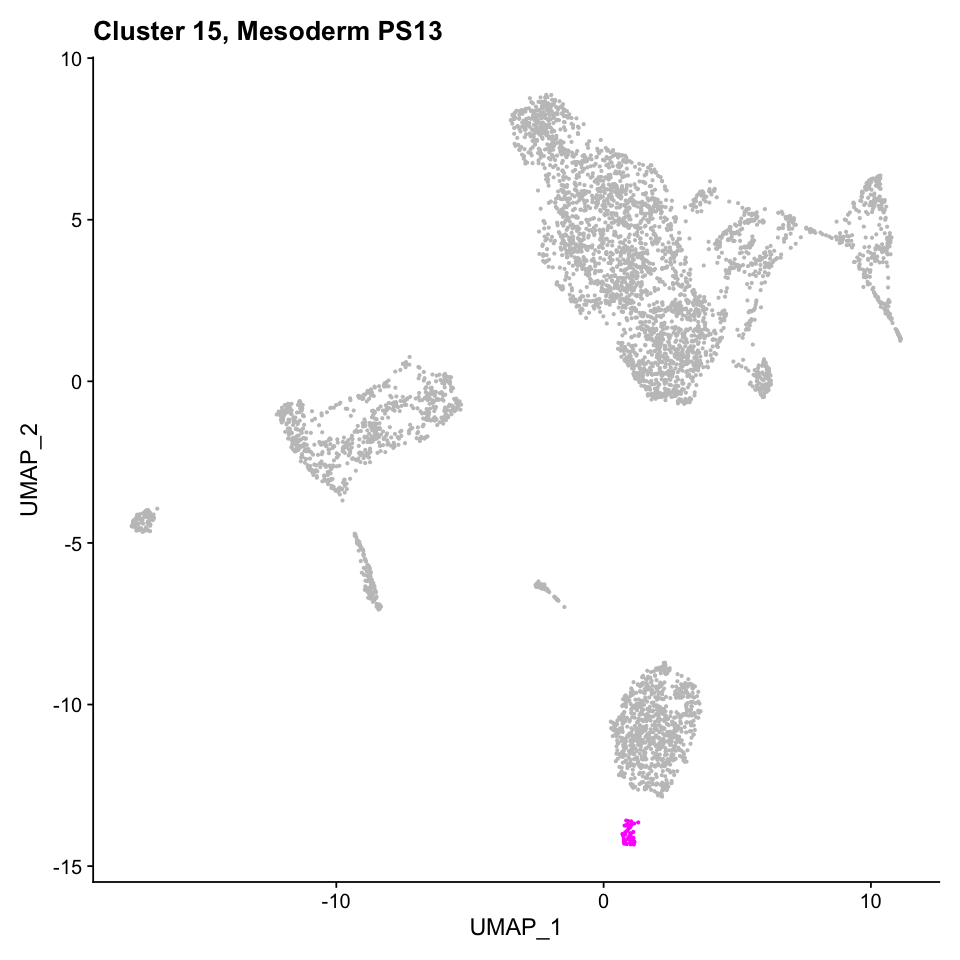

In [76]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(15))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 15, Mesoderm PS13')

In [77]:
seu.meso.ps13 <- subset(seu_HQC, ident = 15)
seu.meso.ps13

An object of class Seurat 
28364 features across 57 samples within 2 assays 
Active assay: SCT (10860 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  SoxN, sog, CG13427, trn, E(spl)m4-BFM, Antp, hth, Lac, CG15628, Brd 
	   ths, salm, E(spl)mgamma-HLH, ImpL2, cv-2, blot, Tet, Dl, CG13217, Ubx 
	   BobA, CG34224, D, aop, Tom, E(spl)malpha-BFM, mirr, ASPP, toc, E(spl)m7-HLH 
Negative:  Abd-B, CadN, hll, twi, sna, ich, Mef2, sprt, zfh1, Act87E 
	   htl, CG12177, FoxL1, Cyp310a1, Mes2, CG43355-sala, CG16758, stumps, CG3036, scrt 
	   VepD, tin, eve, mthl1, NetA, Six4, lncRNA:iab8, Ama, sty, GEFmeso 
PC_ 2 
Positive:  eve, h, hh, Six4, en, sna, Tollo, ich, lncRNA:bxd, DIP-epsilon 
	   mtd, Nrt, wntD, bnl, scyl, CG17716, sty, kibra, Npc2g, lin-28 
	   pxb, ImpL2, mid, opa, Elk, CG14688, Mur89F, Ire1, lncRNA:CR43617, Desat1 
Negative:  scrt, Nplp2, run, HmgZ, lncRNA:iab8, Abd-B, CG12177, zfh1, FoxL1, CG42762 
	   CG14269, lncRNA:alphagamma-element, nAChRalpha7, Mid1, b

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 57
Number of edges: 1596

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2000
Number of communities: 1
Elapsed time: 0 seconds


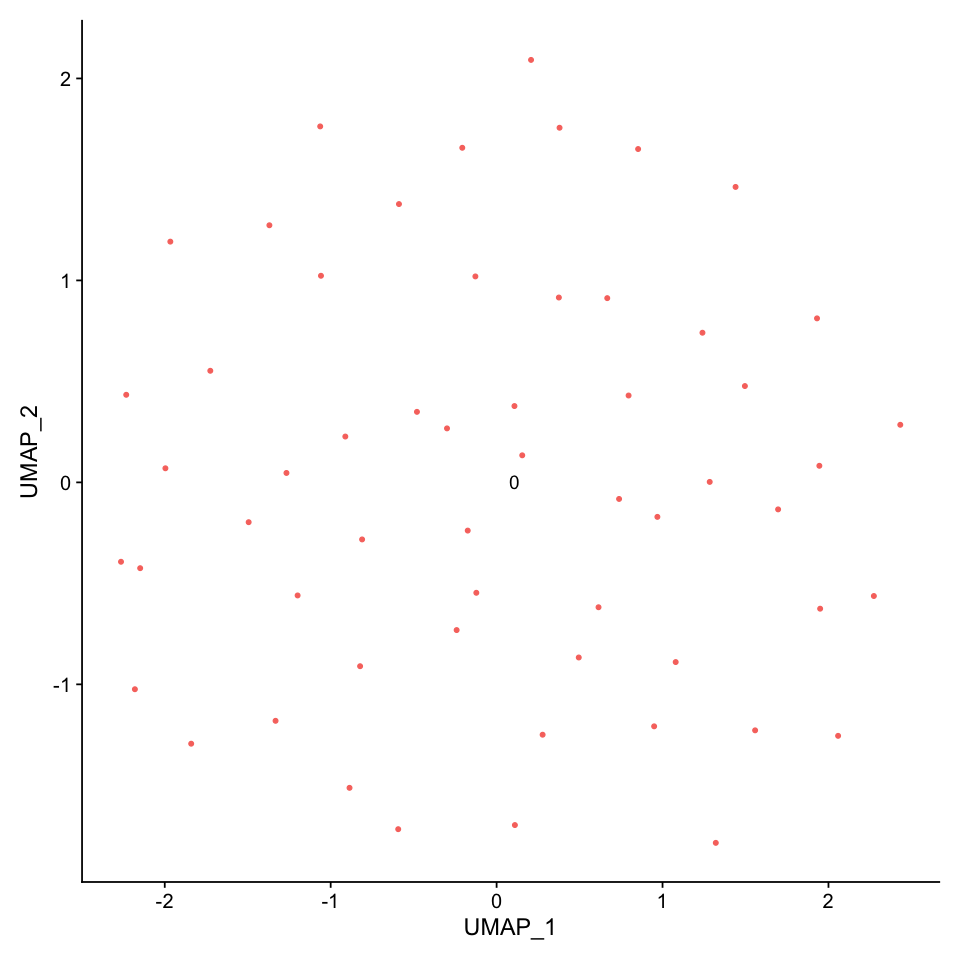

In [78]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.ps13 <- RunPCA(seu.meso.ps13)
seu.meso.ps13 <- RunUMAP(seu.meso.ps13, dims = 1:30)
seu.meso.ps13 <- FindNeighbors(seu.meso.ps13, dims = 1:30)
seu.meso.ps13 <- FindClusters(seu.meso.ps13)
DimPlot(seu.meso.ps13, reduction = 'umap', label = TRUE) + NoLegend()

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 57
Number of edges: 1596

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.0179
Number of communities: 2
Elapsed time: 0 seconds


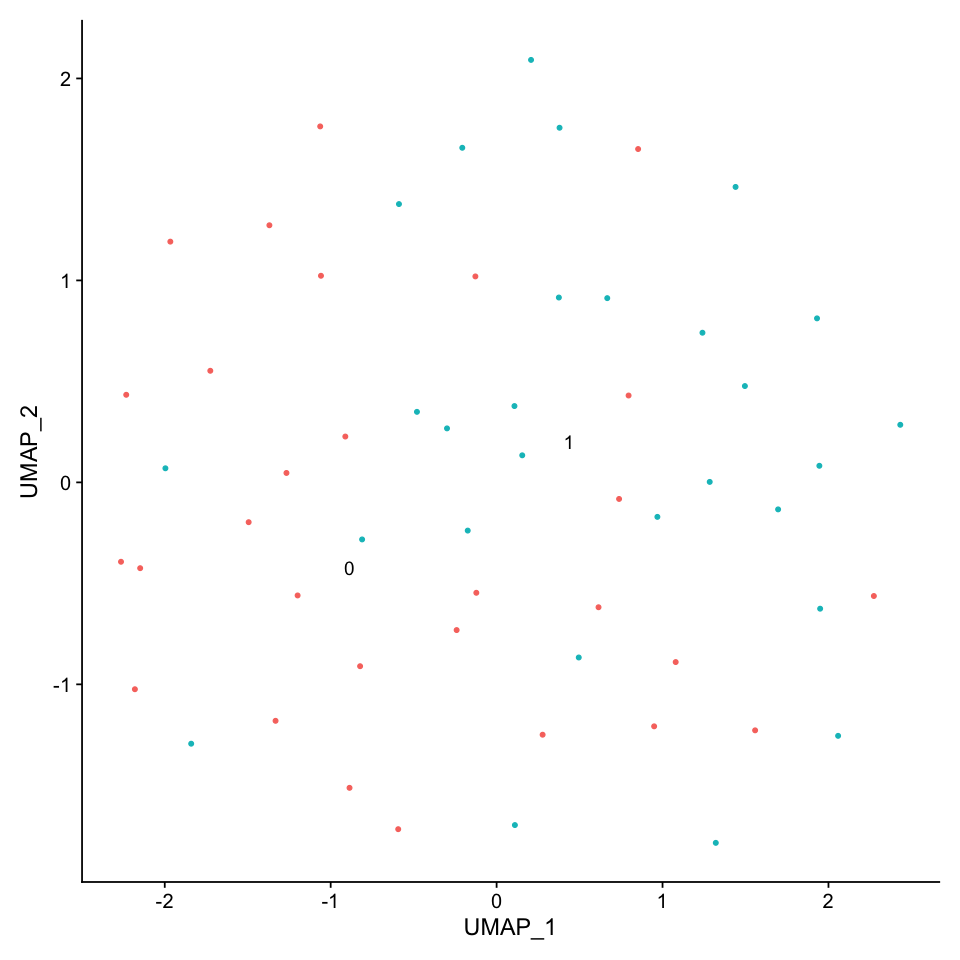

In [79]:
seu.meso.ps13 <- FindClusters(seu.meso.ps13,resolution=1.0)
DimPlot(seu.meso.ps13, reduction = 'umap', label = TRUE) + NoLegend()

In [80]:
all.markers.meso <- FindAllMarkers(object = seu.meso.ps13, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1



[1] 106

[1] 20

Warning message in DoHeatmap(seu.meso.ps13, features = c(all.markers.meso.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: CG9581, CG14210, CG33170, beta-Man, Rpp20-CG33932, ppan”


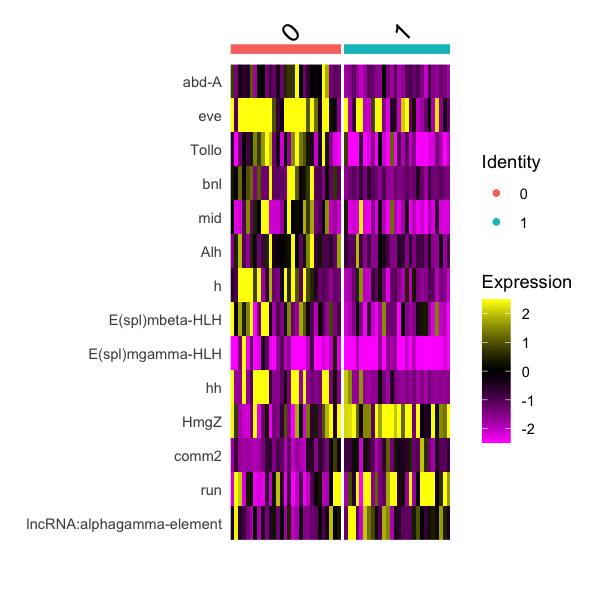

In [81]:
options(repr.plot.width=5, repr.plot.height=5)
DoHeatmap(seu.meso.ps13, features = c(all.markers.meso.top10$gene))

In [82]:
seu.meso.ps13$manual_ID <- 'mesoderm_PS13'

## Save Object

In [83]:
seu.meso.merge <- merge(x = seu.trunk.meso, y =c(seu.meso.gcm, seu.meso.ps13, seu.meso.post, seu.lowquality))
seu.others <- subset(seu_HQC, cells=colnames(seu.meso.merge), invert=TRUE)
seu.others$manual_ID <- 'others'
seu.result <- merge(x=seu.meso.merge, y=seu.others)
seu_HQC$manual_ID <- as.data.frame(seu.result$manual_ID)

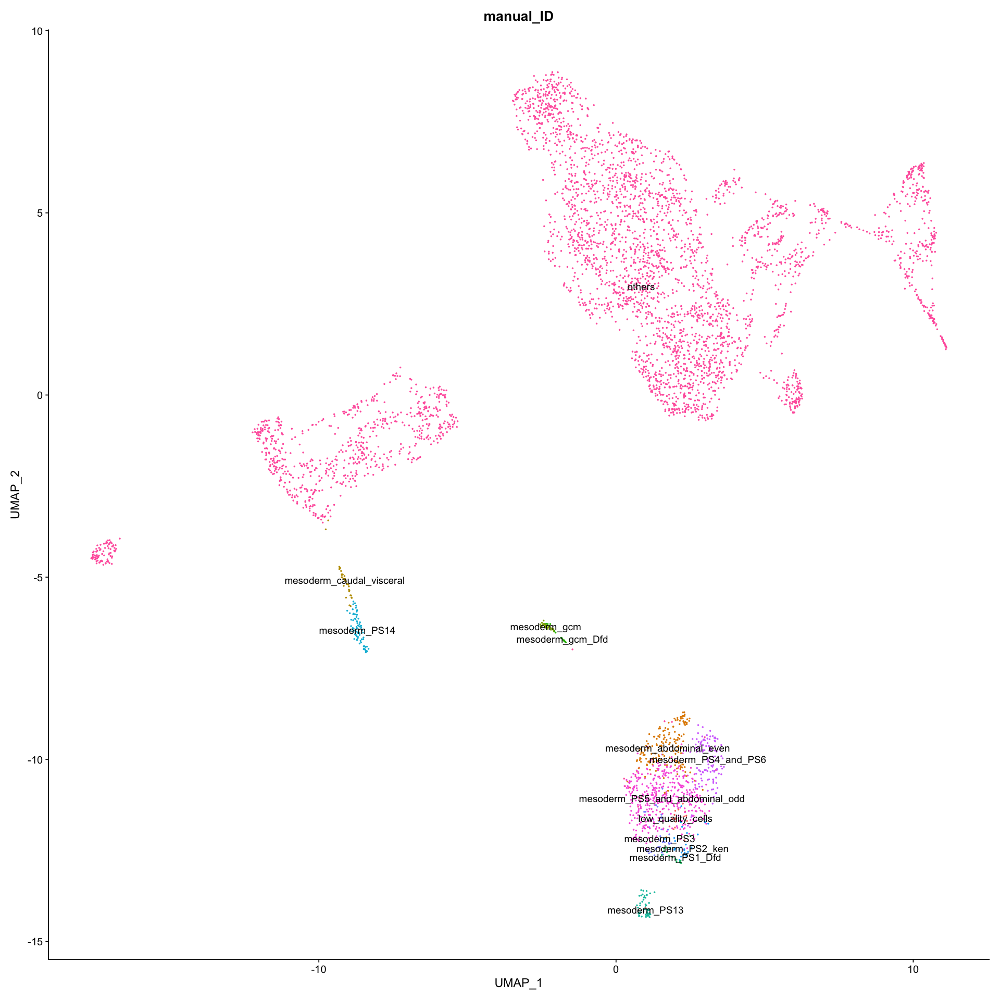

In [84]:
options(repr.plot.width=16, repr.plot.height=16)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'manual_ID') + NoLegend()

In [85]:
saveRDS(object = seu.meso.merge, file = '../../data/seurat_object/Set2/subclustering/seu_meso_subclustered.obj')

In [86]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] tibble_3.0.5      dplyr_1.0.3       Matrix_1.3-2      data.table_1.13.6
[5] magrittr_2.0.1    ggplot2_3.3.3     Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18   
 [13] uwot_0.1.10           mgcv